In [272]:
# import those beauties
import pandas as pd
import geopandas as gpd
import geopy
from geopandas.tools import geocode
import contextily as ctx
from geopy.geocoders import Nominatim
import csv
import shapely
import matplotlib.pyplot as plt
import matplotlib.colors 
import numpy as np
import math
import seaborn as sns
from geopandas import GeoDataFrame
from shapely.geometry import Polygon, Point
import pylab as pl
import Ipython


import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
%matplotlib inline

ModuleNotFoundError: No module named 'Ipython'

# import and merge datasets

In [6]:
real_raw = pd.read_csv('/Users/trevorban/Desktop/ames_project/Machine Learning Project Proposal/data/Ames_Real_Estate_Data.csv')
train_raw = pd.read_csv('/Users/trevorban/Desktop/ames-housing-prediction/Data_Master/TRAIN.csv')
test_raw = pd.read_csv('/Users/trevorban/Desktop/ames-housing-prediction/Data_Master/TEST.csv')

In [7]:
test_raw.shape

(476, 173)

In [8]:
train_raw.shape

(1902, 173)

In [9]:
train_raw.head()

,Unnamed: 0,MapRefNo,Neighborhood,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice
0,1736,923250210,Mitchel,988,21750,0,2,5,5,1954,1954,0.0,3,3,3,3,1,1,0.0,1,0.0,988.0,988.0,5,1,988,0,0,0.0,0.0,1,0,2,1,3,4,8,0,1954.0,2,2.0,520.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,113000,1976.0,57.186235,1.000000,0.0,22270.0,11502.443218,5.074091,11.635143
1,1355,534177210,NWAmes,1242,9600,0,1,7,6,1973,1973,320.0,3,3,3,3,1,5,916.0,1,0.0,326.0,1242.0,2,1,1242,0,0,0.0,0.0,1,1,3,1,3,6,8,1,1973.0,1,2.0,528.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,175500,2484.0,70.652174,0.262480,0.0,10128.0,-639.556782,17.328199,12.075394
2,6,528228540,Blmngtn,1246,3710,0,1,7,5,2007,2008,20.0,4,3,4,3,4,1,0.0,1,0.0,1146.0,1146.0,5,1,1246,0,0,0.0,0.0,2,0,2,1,4,5,8,1,2007.0,3,2.0,428.0,3

In [10]:
train_df = train_raw.copy()
test_df = test_raw.copy()
real = real_raw.copy()

In [11]:
train_df.head()

,Unnamed: 0,MapRefNo,Neighborhood,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice
0,1736,923250210,Mitchel,988,21750,0,2,5,5,1954,1954,0.0,3,3,3,3,1,1,0.0,1,0.0,988.0,988.0,5,1,988,0,0,0.0,0.0,1,0,2,1,3,4,8,0,1954.0,2,2.0,520.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,113000,1976.0,57.186235,1.000000,0.0,22270.0,11502.443218,5.074091,11.635143
1,1355,534177210,NWAmes,1242,9600,0,1,7,6,1973,1973,320.0,3,3,3,3,1,5,916.0,1,0.0,326.0,1242.0,2,1,1242,0,0,0.0,0.0,1,1,3,1,3,6,8,1,1973.0,1,2.0,528.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,175500,2484.0,70.652174,0.262480,0.0,10128.0,-639.556782,17.328199,12.075394
2,6,528228540,Blmngtn,1246,3710,0,1,7,5,2007,2008,20.0,4,3,4,3,4,1,0.0,1,0.0,1146.0,1146.0,5,1,1246,0,0,0.0,0.0,2,0,2,1,4,5,8,1,2007.0,3,2.0,428.0,3

In [12]:
real = real[['MapRefNo', 'Prop_Addr', 'Neighborhood']]

In [13]:
real['Address'] = real['Prop_Addr'] + " Ames Iowa"

In [14]:
train_df = train_df.merge(real, how='left', on = 'MapRefNo')
test_df = test_df.merge(real, how='left', on = 'MapRefNo')
#df1 = df1.merge(real, how='left', left_on = 'PID', right_on='MapRefNo')

# define those fine functions


In [15]:
def too_far(x):
    df = pd.DataFrame(x)
    df2 = pd.DataFrame()
    for i in range(len(x)):
        if float(df.iloc[[i]]['lon']) > -93.72 and float(df.iloc[[i]]['lon']) < -93.56 and float(df.iloc[[i]]['lat']) < 42.08 and float(df.iloc[[i]]['lat']) > 41.98:
            df2 = df2.append(df.iloc[[i]])
    #print("too_far removed rows:" + str(len(df) - len(df2)))
    return(GeoDataFrame(df2))

def collect_too_far(x):
    df = pd.DataFrame(x)
    df2 = pd.DataFrame()
    for i in range(len(x)):
        if float(df.iloc[[i]]['lon']) < -93.72 or float(df.iloc[[i]]['lon']) > -93.56 or float(df.iloc[[i]]['lat']) > 42.08 or float(df.iloc[[i]]['lat']) < 41.98:
            df2 = df2.append(df.iloc[[i]])
    #print("too_far removed rows:" + str(len(df) - len(df2)))
    return(GeoDataFrame(df2))

def find_dist(a, b):
    x = float(a['lon']) - float(b['lon'])
    y = float(a['lat']) - float(b['lat'])
    dist = math.sqrt(x**2 + y**2)
    return dist

def remove_empty(x):
    df = pd.DataFrame(x)
    df2 = pd.DataFrame()
    for i in range(len(x)):
        if len(str(df.iloc[[i]]['address'])) >= 50:
            df2 = df2.append(df.iloc[[i]])
    #print("remove_empty removed rows:" + str(len(df) - len(df2)))
    return GeoDataFrame(df2)

def collect_empty(x):
    df = pd.DataFrame(x)
    df2 = pd.DataFrame()
    for i in range(len(x)):
        if len(str(df.iloc[[i]]['address'])) < 50:
            df2 = df2.append(df.iloc[[i]])
    #print("remove_empty removed rows:" + str(len(df) - len(df2)))
    return GeoDataFrame(df2)

def remove_empty_name(x):
    df = pd.DataFrame(x)
    df2 = pd.DataFrame()
    for i in range(len(x)):
        if len(str(df.iloc[[i]]['name'])) > 39:
            df2 = df2.append(df.iloc[[i]])
    #print("removed rows:" + str(len(df) - len(df2)))
    return GeoDataFrame(df2)

def nearest_park(x):
    pass

def lon_lat(df):
    #df['lon'] = df.geometry.apply(lambda p: p.x)
    #df['lat'] = df.geometry.apply(lambda p: p.y)
    pass

# make address column and find coordinates

In [16]:
# miniaturize for easier testing
#test = df.head(200)

In [17]:
# find coordinates for houses in merged dataset
geo_test_raw = geocode(test_df['Address'], provider='nominatim', user_agent='autogis_xx', timeout=4)
geo_train_raw = geocode(train_df['Address'], provider='nominatim', user_agent='autogis_xx', timeout=4)

# splitting the geo into train and test

In [18]:
geo_test = geo_test_raw.copy()
geo_train = geo_train_raw.copy()

In [19]:
print(geo_test.shape)
print(geo_train.shape)

(482, 2)
(1937, 2)


In [20]:
test_ = pd.merge(test_df, geo_test, left_index=True, right_index=True)
train_ = pd.merge(train_df, geo_train, left_index=True, right_index=True)

In [21]:
train = train_.copy()
test = test_.copy()

# attempted error correction for geo data

In [22]:
# find and collect address errors
train_errors = collect_empty(train)
test_errors = collect_empty(test)

In [23]:
train_errors[['MapRefNo', 'Address']].head()

,MapRefNo,Address
128,528188120,3702 CHILTON AVE Ames Iowa
207,535403030,114 E O NEIL DR Ames Iowa
217,533128090,2700 NORTHRIDGE CIR Ames Iowa
231,528188060,3716 ASHTON DR Ames Iowa
248,903453080,206 N RIVERSIDE DR Ames Iowa


# addresses and coordinates of errors

In [24]:
3629 CHILTON AVE Ames Iowa (42.05726229741331, -93.65106937957704)
3623 CHILTON AVE Ames Iowa (42.05716365921223, -93.65118739676194)
2416 DALTON CIR Ames Iowa (42.05440423947726, -93.64099223540217)
2700 NORTHRIDGE CIR Ames Iowa (42.04824105299274, -93.64982861025717)
2422 DALTON CIR Ames Iowa (42.05411650743543, -93.64112525258706)
200 TRAIL RIDGE RD Ames Iowa (42.02397415851024, -93.67334173922787)
3716 ASHTON DR Ames Iowa (42.057586467215614, -93.65017172928674)
1215 HYLAND AVE Ames Iowa (42.034189622515775, -93.65602714549665) ? 
3702 CHILTON AVE Ames Iowa (42.05726922923628, -93.65041179122713)
4302 COCHRANE PKWY Ames Iowa (42.016614654446, -93.67632859307321)
114 E O NEIL DR Ames Iowa (42.04000146414072, -93.60944316239264)
329 FRANKLIN AVE Ames Iowa (42.02631259751654, -93.66419255195422)
1505 LITTLE BLUESTEM CT UNIT 116 Ames Iowa (42.00969401669757, -93.64595208326823)
2713 NORTHRIDGE CIR Ames Iowa (42.048530513205236, -93.65084873113189)
120 E O NEIL DR Ames Iowa (42.03992221959975, -93.60969080229717)
3703 CHILTON AVE Ames Iowa (42.057253411016475, -93.65143250229669)
212 TRAIL RIDGE RD Ames Iowa (42.02431955934648, -93.67396874462764)
709 CLARK AVE 709 1/2 Ames Iowa (42.02834276592506, -93.6173860022975)
916 WILSON AVE 918 Ames Iowa (42.0308328407873, -93.61810877346247)
307 FRANKLIN AVE Ames Iowa (42.018998223756995, -93.66502139341341)
1505 LITTLE BLUESTEM CT UNIT 119 Ames Iowa (42.009966266543664, -93.64605553113302)
1505 LITTLE BLUESTEM CT UNIT 103 Ames Iowa (42.00984090737053, -93.64695707346299)
3709 ASHTON DR Ames Iowa (42.05722471102373, -93.65056670229669)
2421 DALTON CIR Ames Iowa (42.054537114252625, -93.64163773113174)
427 FRANKLIN AVE Ames Iowa (42.01811012505003, -93.66505710108332)
216 FRANKLIN AVE Ames Iowa (42.02033930909231, -93.6645107446277)
3715 FARNHAM DR Ames Iowa (42.05749187683051, -93.64998627346169)
1505 LITTLE BLUESTEM CT UNIT 107 Ames Iowa (42.00991809472818, -93.64679037346302)
236 TRAIL RIDGE RD Ames Iowa (42.025212279214486, -93.67367740229761)
104 E 20TH ST 106 Ames Iowa (42.04179982921327, -93.61034368113211)
1506 LITTLE BLUESTEM CT Ames Iowa (42.009165866944926, -93.64624281579309)
133 E O NEIL DR Ames Iowa (42.040108511162465, -93.60901975996714)
1510 LITTLE BLUESTEM CT Ames Iowa (42.00919489500025, -93.64653554462807)
2108 HUGHES AVE Ames Iowa (42.01686760825066, -93.64285364462785)
2133 CONEFLOWER CT Ames Iowa (42.00916090728543, -93.64393943113303)
1505 LITTLE BLUESTEM CT UNIT 106 Ames Iowa (42.00955313545425, -93.646610502298)
234 SOUTH DAKOTA AVE 236 Ames Iowa (42.019940270376786, -93.67830733695777)
206 N RIVERSIDE DR Ames Iowa (42.024256449253905, -93.6295883311326)
1504 LITTLE BLUESTEM CT Ames Iowa (42.00912787921586, -93.64614273113303)
2027 INDIANGRASS CT Ames Iowa (42.009909035543444, -93.641905188803)
4107 TRAIL RIDGE CIR Ames Iowa (42.0246394492059, -93.67493454462762)
335 FRANKLIN AVE Ames Iowa (42.026165229178744, -93.66515658943324)
1505 LITTLE BLUESTEM CT UNIT 114 Ames Iowa (42.0095504948665, -93.64623340229801)
3705 ASHTON DR Ames Iowa (42.05711767697135, -93.65058895996664)
3602 FARNHAM DR Ames Iowa (42.05662424519279, -93.65088525996667)
1115 HYLAND AVE Ames Iowa (42.03249909326518, -93.65601237346237)
102 N RIVERSIDE DR Ames Iowa (42.022992079214774, -93.62956521579268)
102 N RIVERSIDE DR Ames Iowa (42.022992079214774, -93.62956521579268)
113 E O NEIL DR Ames Iowa (42.040418647226446, -93.61007577346217)
104 E O NEIL DR Ames Iowa (42.03998661114712, -93.6104120734622)
112 N RIVERSIDE DR Ames Iowa (42.02332393890506, -93.62960813113263)
1505 LITTLE BLUESTEM CT UNIT 112 Ames Iowa (42.009528363565636, -93.64632337346302)
3712 CHILTON AVE Ames Iowa (42.05744967921203, -93.65084763113168)
323 FRANKLIN AVE Ames Iowa (42.025785814738576, -93.66512382409333)
912 GRAND AVE 914 Ames Iowa (42.03067045463089, -93.62000943424289)
326 N RIVERSIDE DR Ames Iowa (42.0258901395483, -93.6290613446276)
2138 HUGHES AVE Ames Iowa (42.01634050818466, -93.64379374462787)
4205 COCHRANE PKWY Ames Iowa (42.01740209191377, -93.67561625996781)
207 TRAIL RIDGE RD Ames Iowa (42.02407281934035, -93.67455397346262)
212 HOWARD AVE 214 Ames Iowa (42.02424262902411, -93.65822295229762)
301 FRANKLIN AVE Ames Iowa (42.02505521571397, -93.66515123943329)
219 WILMOTH AVE 221 Ames Iowa (42.02448074922587, -93.66189255996758)
2425 DALTON CIR Ames Iowa (42.0545403116973, -93.6419869446268)
3717 ASHTON DR Ames Iowa (42.05759134507138, -93.65058545996665)
124 FRANKLIN AVE Ames Iowa (42.023668938082906, -93.66448083880263)
201 E O NEIL DR Ames Iowa (42.039918906920526, -93.60871974462718)

SyntaxError: invalid syntax (<ipython-input-24-18e33516581d>, line 1)

In [25]:
address = [
'3629 CHILTON AVE Ames Iowa',
'3623 CHILTON AVE Ames Iowa',
'2416 DALTON CIR Ames Iowa',
'2700 NORTHRIDGE CIR Ames Iowa',
'2422 DALTON CIR Ames Iowa',
'200 TRAIL RIDGE RD Ames Iowa',
'3716 ASHTON DR Ames Iowa',
'1215 HYLAND AVE Ames Iowa',
'3702 CHILTON AVE Ames Iowa',
'4302 COCHRANE PKWY Ames Iowa',
'114 E O NEIL DR Ames Iowa',
'329 FRANKLIN AVE Ames Iowa',
'1505 LITTLE BLUESTEM CT UNIT 116 Ames Iowa',
'2713 NORTHRIDGE CIR Ames Iowa',
'120 E O NEIL DR Ames Iowa',
'3703 CHILTON AVE Ames Iowa',
'212 TRAIL RIDGE RD Ames Iowa',
'709 CLARK AVE 709 1/2 Ames Iowa',
'916 WILSON AVE 918 Ames Iowa',
'307 FRANKLIN AVE Ames Iowa',
'1505 LITTLE BLUESTEM CT UNIT 119 Ames Iowa',
'1505 LITTLE BLUESTEM CT UNIT 103 Ames Iowa',
'3709 ASHTON DR Ames Iowa',
'2421 DALTON CIR Ames Iowa', 
'427 FRANKLIN AVE Ames Iowa',
'216 FRANKLIN AVE Ames Iowa',
'3715 FARNHAM DR Ames Iowa',
'1505 LITTLE BLUESTEM CT UNIT 107 Ames Iowa',
'236 TRAIL RIDGE RD Ames Iowa', 
'104 E 20TH ST 106 Ames Iowa',
'1506 LITTLE BLUESTEM CT Ames Iowa', 
'133 E O NEIL DR Ames Iowa', 
'1510 LITTLE BLUESTEM CT Ames Iowa',
'2108 HUGHES AVE Ames Iowa',
'2133 CONEFLOWER CT Ames Iowa',
'1505 LITTLE BLUESTEM CT UNIT 106 Ames Iowa',
'234 SOUTH DAKOTA AVE 236 Ames Iowa', 
'206 N RIVERSIDE DR Ames Iowa',
'1504 LITTLE BLUESTEM CT Ames Iowa',
'2027 INDIANGRASS CT Ames Iowa',
'4107 TRAIL RIDGE CIR Ames Iowa',
'335 FRANKLIN AVE Ames Iowa', 
'1505 LITTLE BLUESTEM CT UNIT 114 Ames Iowa',
'3705 ASHTON DR Ames Iowa',
'3602 FARNHAM DR Ames Iowa',
'1115 HYLAND AVE Ames Iowa',
'102 N RIVERSIDE DR Ames Iowa', 
'102 N RIVERSIDE DR Ames Iowa',
'113 E O NEIL DR Ames Iowa', 
'104 E O NEIL DR Ames Iow',
'112 N RIVERSIDE DR Ames Iowa',
'1505 LITTLE BLUESTEM CT UNIT 112 Ames Iowa',
'3712 CHILTON AVE Ames Iowa',
'323 FRANKLIN AVE Ames Iowa',
'912 GRAND AVE 914 Ames Iowa',
'326 N RIVERSIDE DR Ames Iowa',
'2138 HUGHES AVE Ames Iowa',
'4205 COCHRANE PKWY Ames Iowa',
'207 TRAIL RIDGE RD Ames Iowa',
'212 HOWARD AVE 214 Ames Iowa',
'301 FRANKLIN AVE Ames Iowa',
'219 WILMOTH AVE 221 Ames Iowa',
'2425 DALTON CIR Ames Iowa',
'3717 ASHTON DR Ames Iowa',
'124 FRANKLIN AVE Ames Iowa',
'201 E O NEIL DR Ames Iowa']

In [26]:
corrections = pd.DataFrame([
    (42.05726229741331, -93.65106937957704),
    (42.05716365921223, -93.65118739676194),
    (42.05440423947726, -93.64099223540217),
    (42.04824105299274, -93.64982861025717),
    (42.05411650743543, -93.64112525258706),
    (42.02397415851024, -93.67334173922787),
    (42.057586467215614, -93.65017172928674),
    (42.034189622515775, -93.65602714549665),
    (42.05726922923628, -93.65041179122713),
    (42.016614654446, -93.67632859307321),
    (42.04000146414072, -93.60944316239264),
    (42.02631259751654, -93.66419255195422),
    (42.00969401669757, -93.64595208326823),
    (42.048530513205236, -93.65084873113189),
    (42.03992221959975, -93.60969080229717),
    (42.057253411016475, -93.65143250229669),
    (42.02431955934648, -93.67396874462764),
    (42.02834276592506, -93.6173860022975),
    (42.0308328407873, -93.61810877346247),
    (42.018998223756995, -93.66502139341341),
    (42.009966266543664, -93.64605553113302),
    (42.00984090737053, -93.64695707346299),
    (42.05722471102373, -93.65056670229669),
    (42.054537114252625, -93.64163773113174),
    (42.01811012505003, -93.66505710108332),
    (42.02033930909231, -93.6645107446277),
    (42.05749187683051, -93.64998627346169),
    (42.00991809472818, -93.64679037346302),
    (42.025212279214486, -93.67367740229761),
    (42.04179982921327, -93.61034368113211),
    (42.009165866944926, -93.64624281579309),
    (42.040108511162465, -93.60901975996714),
    (42.00919489500025, -93.64653554462807),
    (42.01686760825066, -93.64285364462785),
    (42.00916090728543, -93.64393943113303),
    (42.00955313545425, -93.646610502298),
    (42.019940270376786, -93.67830733695777),
    (42.024256449253905, -93.6295883311326),
    (42.00912787921586, -93.64614273113303),
    (42.009909035543444, -93.641905188803),
    (42.0246394492059, -93.67493454462762),
    (42.026165229178744, -93.66515658943324),
    (42.0095504948665, -93.64623340229801),
    (42.05711767697135, -93.65058895996664),
    (42.05662424519279, -93.65088525996667),
    (42.03249909326518, -93.65601237346237),
    (42.022992079214774, -93.62956521579268),
    (42.022992079214774, -93.62956521579268),
    (42.040418647226446, -93.61007577346217),
    (42.03998661114712, -93.6104120734622),
    (42.02332393890506, -93.62960813113263),
    (42.009528363565636, -93.64632337346302),
    (42.05744967921203, -93.65084763113168),
    (42.025785814738576, -93.66512382409333),
    (42.03067045463089, -93.62000943424289),
    (42.0258901395483, -93.6290613446276),
    (42.01634050818466, -93.64379374462787),
    (42.01740209191377, -93.67561625996781),
    (42.02407281934035, -93.67455397346262),
    (42.02424262902411, -93.65822295229762),
    (42.02505521571397, -93.66515123943329),
    (42.02448074922587, -93.66189255996758),
    (42.0545403116973, -93.6419869446268),
    (42.05759134507138, -93.65058545996665),
    (42.023668938082906, -93.66448083880263),
    (42.039918906920526, -93.60871974462718)])

In [27]:
latitude = list(corrections[0])
longitude = list(corrections[1])
print(len(latitude))
print(len(longitude))
print(len(address))

66
66
66


In [28]:
errors_df = pd.DataFrame({'Address': address, 'lon':longitude, 'lat': latitude})

In [29]:
errors_gdf = gpd.GeoDataFrame(
    errors_df, geometry=gpd.points_from_xy(errors_df.lon, errors_df.lat))

In [30]:
type(errors_gdf.geometry[0])

shapely.geometry.point.Point

# remove errors, add lon lat, and remove too far houses

In [31]:
# remove error rows 
train = remove_empty(train)
test = remove_empty(test)

print(train.shape)
print(test.shape)

(1893, 178)
(469, 178)


In [32]:
# split geometry into lon and lat columns
train['lon'] = train.geometry.apply(lambda p: p.x)
train['lat'] = train.geometry.apply(lambda p: p.y)

test['lon'] = test.geometry.apply(lambda p: p.x)
test['lat'] = test.geometry.apply(lambda p: p.y)

In [33]:
# find and collect addresses outside of the scope of the map
train_too_fars = collect_too_far(train)
test_too_fars = collect_too_far(test)

In [34]:
print(train_too_fars.shape)
print(test_too_fars.shape)

(13, 180)
(2, 180)


In [35]:
# remove addresses outside of the scope of the map
train = too_far(train)
test = too_far(test)

In [36]:
print(train.shape)
print(test.shape)

(1880, 180)
(467, 180)


# the too_fars

In [37]:
# The 15 houses present do not have addresses in the real dataset.  
# these houses will remain removed
train_too_fars.head()

,Unnamed: 0,MapRefNo,Neighborhood_x,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice,Prop_Addr,Neighborhood_y,Address,geometry,address,lon,lat
225,376,535300120,NAmes,1382,19296,0,1,6,5,1962,1962,399.0,3,3,3,3,4,3,672.0,5,690.0,0.0,1362.0,3,1,1382,0,0,1.0,0.0,1,0,3,1,3,6,8,1,1991.0,1,2.0,884.0,3,3,0,0,252,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,176000,2744.0,64.139942,0.000000,0.0,20432.0,9664.443218,8.613939,12.078239,NaN,NaN,NaN,POINT (11.04803 46.31448),"Nanno, Ville d'Anaunia, Comunità della Val di ...",11.048029,46.314475
449,2327,905450020,Edwards,1689,9855,0,1,6,5,1956,1956,0.0,3,3,3,3,1,1,0.0,1,0.0,1436.0,1436.0,2,1,1689,0,0,0.0,0.0,1,0,3,1,3,7,8,1,1956.0,1,2.0,480.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,127500,3125.0,40.800000,1.000000,0.0,10335.0,-43

# merge corrected coordinates back on to train and test sets

In [38]:
errors_gdf.head()

,Address,lon,lat,geometry
0,3629 CHILTON AVE Ames Iowa,-93.651069,42.057262,POINT (-93.65107 42.05726)
1,3623 CHILTON AVE Ames Iowa,-93.651187,42.057164,POINT (-93.65119 42.05716)
2,2416 DALTON CIR Ames Iowa,-93.640992,42.054404,POINT (-93.64099 42.05440)
3,2700 NORTHRIDGE CIR Ames Iowa,-93.649829,42.048241,POINT (-93.64983 42.04824)
4,2422 DALTON CIR Ames Iowa,-93.641125,42.054117,POINT (-93.64113 42.05412)


In [39]:
# merge the corrected coordinates with test_errors
test_errors_corrected = pd.merge(test_errors, errors_gdf, how='left', on = 'Address')
test_errors_corrected  = test_errors_corrected.drop(columns='geometry_x')
test_errors_corrected  = test_errors_corrected.rename(columns={'geometry_y': 'geometry'})
print(test_errors_corrected.shape)
print(test.shape)

(13, 180)
(467, 180)


In [40]:
# merge the corrected coordinates with train_errors
train_errors_corrected = pd.merge(train_errors, errors_gdf, how='left', on = 'Address')
train_errors_corrected  = train_errors_corrected.drop(columns='geometry_x')
train_errors_corrected  = train_errors_corrected.rename(columns={'geometry_y': 'geometry'})
print(train_errors_corrected.shape)
print(train.shape)

(44, 180)
(1880, 180)


In [41]:
# concat both back to the train and test set, now with correct coordinates
test = pd.concat([test, test_errors_corrected])
print(test.shape)

train = pd.concat([train, train_errors_corrected])
print(train.shape)

(480, 180)
(1924, 180)


In [42]:
train[train.lat.isna()] #?  Somehow snuck past my filter
train = train.drop(index = 7)

In [43]:
train = train.reset_index()
test = test.reset_index()

In [44]:
# PLOT TWIST
# all of the houses that returned errors, simply returned errors because they had a duplicate MapRefNo in the df
# Is this from multiple houses that are in the same area, such as units?
# For each of the errors, there was another row in the df that had the same MapRefNo?

# import shp files and subdivide files

In [45]:
# waterways = gpd.read_file('/Users/trevorban/Downloads/ames-shp/shape/waterways.shp')
# roads = gpd.read_file('/Users/trevorban/Downloads/ames-shp/shape/roads.shp')
# railways = gpd.read_file('/Users/trevorban/Downloads/ames-shp/shape/railways.shp')
# places = gpd.read_file('/Users/trevorban/Downloads/ames-shp/shape/places.shp')
# buildings = gpd.read_file('/Users/trevorban/Downloads/ames-shp/shape/buildings.shp')
# landuse = gpd.read_file('/Users/trevorban/Downloads/ames-shp/shape/landuse.shp')
# natural = gpd.read_file('/Users/trevorban/Downloads/ames-shp/shape/natural.shp')
# points = gpd.read_file('/Users/trevorban/Downloads/ames-shp/shape/points.shp')

# fig,ax = plt.subplots(figsize=(15,15))
# waterways.plot(ax = ax, color='red')
# roads.plot(ax = ax, color='black')
# railways.plot(ax = ax, color='red')
# places.plot(ax = ax, color='purple')
# buildings.plot(ax = ax, color='blue')
# landuse.plot(ax = ax, color='purple')
# natural.plot(ax = ax, color='green')
# points.plot(ax = ax, color='black')

In [238]:
waterways = gpd.read_file('/Users/trevorban/Desktop/ames_project/ames-shp2/shape/waterways.shp')
roads = gpd.read_file('/Users/trevorban/Desktop/ames_project/ames-shp2/shape/roads.shp')
railways = gpd.read_file('/Users/trevorban/Desktop/ames_project/ames-shp2/shape/railways.shp')
places = gpd.read_file('/Users/trevorban/Desktop/ames_project/ames-shp2/shape/places.shp')
buildings = gpd.read_file('/Users/trevorban/Desktop/ames_project/ames-shp2/shape/buildings.shp')
landuse = gpd.read_file('/Users/trevorban/Desktop/ames_project/ames-shp2/shape/landuse.shp')
natural = gpd.read_file('/Users/trevorban/Desktop/ames_project/ames-shp2/shape/natural.shp')
points = gpd.read_file('/Users/trevorban/Desktop/ames_project/ames-shp2/shape/points.shp')

# subdivide nature category
nwater = natural[natural['type'] == 'water']
npark = natural[natural['type'] == 'park']
nforest = natural[natural['type'] == 'forest']

# subdivide places category
iowa_state_center = places[places['name'] == 'Iowa State Center']

# find coordinates for particular features
ISU = geocode('901 Stange Rd, Ames, IA 50011', provider='nominatim', user_agent='autogis_xx', timeout=4)
ames_high = geocode('1921 Ames High Dr, Ames, IA 50010', provider='nominatim', user_agent='autogis_xx', timeout=4)

# visualiiiiiiize

In [52]:
double = pd.concat([train, test])
double.shape

(1922, 181)

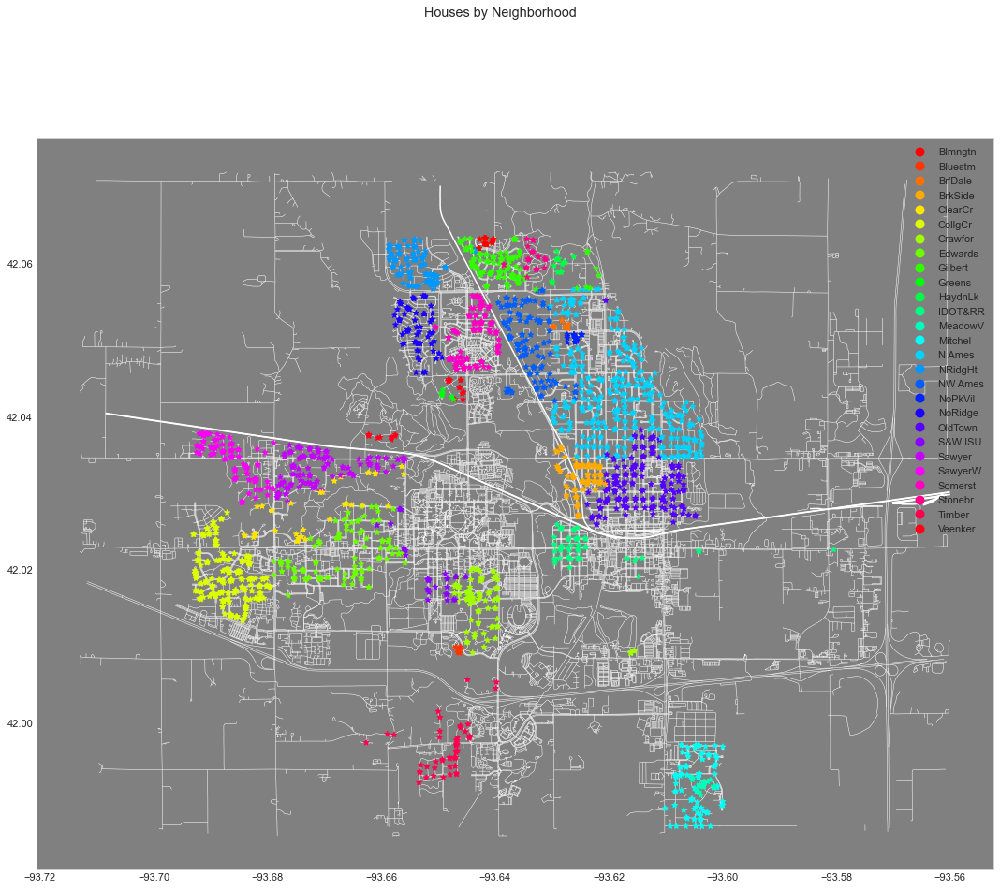

In [308]:
fig,ax = plt.subplots(figsize=(15,15))
double.plot(ax=ax, marker='*', column = 'Neighborhood_y', zorder=2, legend=True, cmap='hsv')
#waterways.plot(ax = ax, color='blue', linewidth=.3)
ax.set(facecolor = "gray")
ax.grid(False)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1)
#places.plot(ax = ax, color='purple', column='type', legend=True)
#buildings.plot(ax = ax, color='blue')
#landuse.plot(ax = ax, color='purple')
#points.plot(ax = ax, color='black')
#nwater.plot(ax=ax, color='#65bbc7', zorder=1)
#nforest.plot(ax=ax, color='green', zorder=1)
#npark.plot(ax=ax, color='#8B0000', zorder=1)
#ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
# iowa_state_center.plot(ax=ax, color = '#f47920', markersize=100)
# ames_high.plot(ax=ax, color = '#f47920', markersize=100, categorical=True,
#              legend=True)
pl.suptitle("Houses by Neighborhood");


# explore park proximity

In [65]:
npark.head()

,osm_id,name,type,geometry
1,44804362,Moore Memorial Park,park,"POLYGON ((-93.64954 42.04537, -93.64954 42.045..."
2,44806238,Brookside Park,park,"POLYGON ((-93.63270 42.02849, -93.63212 42.028..."
3,44806530,Ioway Creek Park,park,"POLYGON ((-93.62175 42.01575, -93.62203 42.015..."
4,44807182,Stuart Smith Park,park,"POLYGON ((-93.63219 42.01635, -93.63173 42.016..."
34,78137196,Sleepy Hollow Canoe Access,park,"POLYGON ((-93.62008 42.06565, -93.61995 42.065..."


In [66]:
newpark = remove_empty_name(npark)

In [67]:
newpark = newpark.to_crs(4326)
ISU = ISU.to_crs(4326)

In [68]:
park_house_dist_train = newpark.geometry.apply(lambda g: train.distance(g))
park_house_dist_test = newpark.geometry.apply(lambda g: test.distance(g))

In [69]:
for i, row in train.iterrows():
    train.at[i,'nearest_park'] = park_house_dist_train[i].min()
    
for i, row in test.iterrows():
    test.at[i,'nearest_park'] = park_house_dist_test[i].min()

In [70]:
train.head()

,index,Unnamed: 0,MapRefNo,Neighborhood_x,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice,Prop_Addr,Neighborhood_y,Address,geometry,address,lon,lat,nearest_park
0,0,1736,923250210,Mitchel,988,21750,0,2,5,5,1954,1954,0.0,3,3,3,3,1,1,0.0,1,0.0,988.0,988.0,5,1,988,0,0,0.0,0.0,1,0,2,1,3,4,8,0,1954.0,2,2.0,520.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,113000,1976.0,57.186235,1.000000,0.0,22270.0,11502.443218,5.074091,11.635143,3714 S DUFF AVE,Mitchel,3714 S DUFF AVE Ames Iowa,POINT (-93.61007 41.98884),"3714, South Duff Avenue, Ames, Story County, I...",-93.610074,41.988843,0.007083
1,1,1355,534177210,NWAmes,1242,9600,0,1,7,6,1973,1973,320.0,3,3,3,3,1,5,916.0,1,0.0,326.0,1242.0,2,1,1242,0,0,0.0,0.0,1,1,3,1,3,6,8,1,1973.0,1,2.0,528.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0

Text(0.5, 1.0, 'sale price against distance to nearest park')

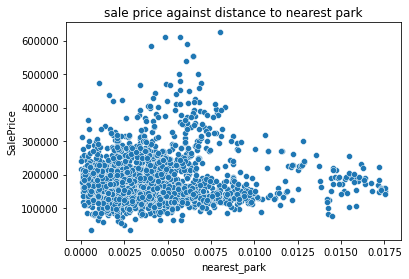

In [71]:
import seaborn as sns
x = sns.scatterplot(x=train.nearest_park, y=train.SalePrice)
x.set_title('sale price against distance to nearest park')

Quick thoughts on my work so far:

This entire notebook has been focused on using geopandas for both visualizations and feature engineering.  The features I was most excited about was 1. distance to nearest park and 2. neighborhood.  First I had to find the coordinates for each house using geocode.  This led to several errors, and about 100 houses were removed from this df because they were either missing or outside of the bounds of the map (either a null or an error).  With the remaining houses, I graphed their sale price with distance to nearest park.  The above graph shows very little impact on saleprice by park proximity.  My next venture with park proximity will be to narrow it down to proximity to particular parks, possibly only parks over a certain size.  The next concern here will be likely multicolinearity with the neighborhood feature.  Proximity to certain parks may just be another way of saying, 'is in x neighborhood'.  



# Stream proximity

In [72]:
streams = waterways[waterways['type'] == 'stream']

In [73]:
streams_train = streams.geometry.apply(lambda g: train.distance(g))
streams_train.head()

streams_test = streams.geometry.apply(lambda g: test.distance(g))
streams_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479
1,0.066655,0.087926,0.130080,0.087936,0.130852,0.095176,0.127819,0.085373,0.125511,0.052062,0.061416,0.053898,0.123709,0.056266,0.089690,0.113980,0.071272,0.075406,0.124369,0.075732,0.133027,0.091448,0.078177,0.107857,0.065538,0.065532,0.090660,0.064631,0.064631,0.059499,0.060889,0.068901,0.094166,0.127828,0.083191,0.067820,0.092641,0.102730,0.057008,0.108600,0.080469,0.089912,0.061460,0.068732,0.068321,0.063196,0.054856,0.054856,0.095108,0.085914,0.048317,0.101335,0.131928,0.055455,0.109800,0.074147,0.066822,0.074831,0.066937,0.120570,0.064549,0.075087,0.065422,0.081426,0.082827,0.093969,0.083808,0.081115,0.113545,0.076284,0.071540,0.094524,0.055175,0.071744,0.131985,0.053263,0.074483,0.111901,0.069789,0.119232,0.077522,0.071436,0.134801,0.132242,0.060922,0.064612,0.132986,0.088707,0.067493,0.076408,0.064071,0.051789,0.124159,0.062673,0.081309,0.069836,0.109179,0.076693,0.126243,0.125773,0.067326,0.129432,0.109091,0.068744,0.090298,0.069278,0.057051,0.050357,0.063636,0.074907,0.093799,0.076693,0.066197,0.077299,0.130723,0.067451,0.070252,0.107636,0.108348,0.089741,0.068353,0.053611,0.130743,0.091474,0.060753,0.062553,0.107888,0.054941,0.112315,0.124567,0.077677,0.092502,0.130077,0.062218,0.081498,0.100430,0.078211,0.056331,0.067003,0.094281,0.083931,0.113364,0.086155,0.082854,0.086601,0.063247,0.099603,0.063973,0.121543,0.097270,0.076577,0.075159,0.073965,0.091407,0.112386,0.055473,0.052138,0.074178,0.109368,0.063700,0.093783,0.061650,0.086970,0.061576,0.066379,0.070082,0.089682,0.113353,0.126050,0.055871,0.108318,0.112526,0.102543,0.120843,0.129120,0.067240,0.084364,0.076038,0.112410,0.083683,0.066954,0.077469,0.070762,0.089626,0.091183,0.052543,0.062112,0.047787,0.056203,0.059209,0.078089,0.112851,0.060716,0.060716,0.065422,0.070270,0.121715,0.099632,0.133249,0.075884,0.098071,0.092126,0.135868,0.068192,0.050691,0.063940,0.062803,0.066509,0.108128,0.049330,0.055836,0.058665,0.087962,0.068063,0.049084,0.102356,0.106205,0.123490,0.085419,0.060378,0.059752,0.056308,0.083837,0.087828,0.130833,0.090659,0.059451,0.058459,0.088592,0.059926,0.088597,0.054205,0.076818,0.126665,0.077645,0.087690,0.117046,0.062869,0.130950,0.057730,0.091953,0.066705,0.076532,

In [74]:
for i, row in train.iterrows():
    train.at[i,'nearest_stream'] = streams_train[i].min()
    
for i, row in test.iterrows():
    test.at[i,'nearest_stream'] = streams_test[i].min()

Text(0.5, 1.0, 'sale price against distance to nearest stream')

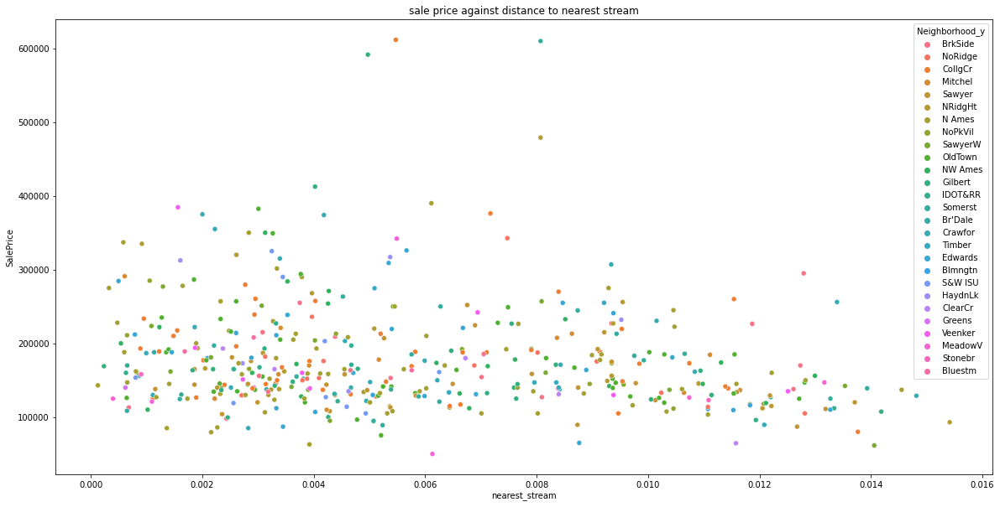

In [76]:
f, ax = plt.subplots(figsize=(20, 10))
x = sns.scatterplot(x=train.nearest_stream, y=train.SalePrice, hue=test['Neighborhood_y'], cmap='hsv')
#plt.xlim(0, .01)
x.set_title('sale price against distance to nearest stream')


# ISU proximity

In [77]:
ISU_dist_train = ISU.geometry.apply(lambda g: train.distance(g))
ISU_dist_test = ISU.geometry.apply(lambda g: test.distance(g))

ISU_dist_train

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [78]:
for i, row in train.iterrows():
    train.at[i,'ISU_distance'] = ISU_dist_train[i].min()
    
for i, row in test.iterrows():
    test.at[i,'ISU_distance'] = ISU_dist_test[i].min()

In [79]:
train.head()

,index,Unnamed: 0,MapRefNo,Neighborhood_x,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice,Prop_Addr,Neighborhood_y,Address,geometry,address,lon,lat,nearest_park,nearest_stream,ISU_distance
0,0,1736,923250210,Mitchel,988,21750,0,2,5,5,1954,1954,0.0,3,3,3,3,1,1,0.0,1,0.0,988.0,988.0,5,1,988,0,0,0.0,0.0,1,0,2,1,3,4,8,0,1954.0,2,2.0,520.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,113000,1976.0,57.186235,1.000000,0.0,22270.0,11502.443218,5.074091,11.635143,3714 S DUFF AVE,Mitchel,3714 S DUFF AVE Ames Iowa,POINT (-93.61007 41.98884),"3714, South Duff Avenue, Ames, Story County, I...",-93.610074,41.988843,0.007083,0.000680,0.053963
1,1,1355,534177210,NWAmes,1242,9600,0,1,7,6,1973,1973,320.0,3,3,3,3,1,5,916.0,1,0.0,326.0,1242.0,2,1,1242,0,0,0.0,0.0,1,1,3,1,3,6,8,1,1973.0,1,2.0,528.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0

Text(0.5, 1.0, 'sale price against distance to ISU')

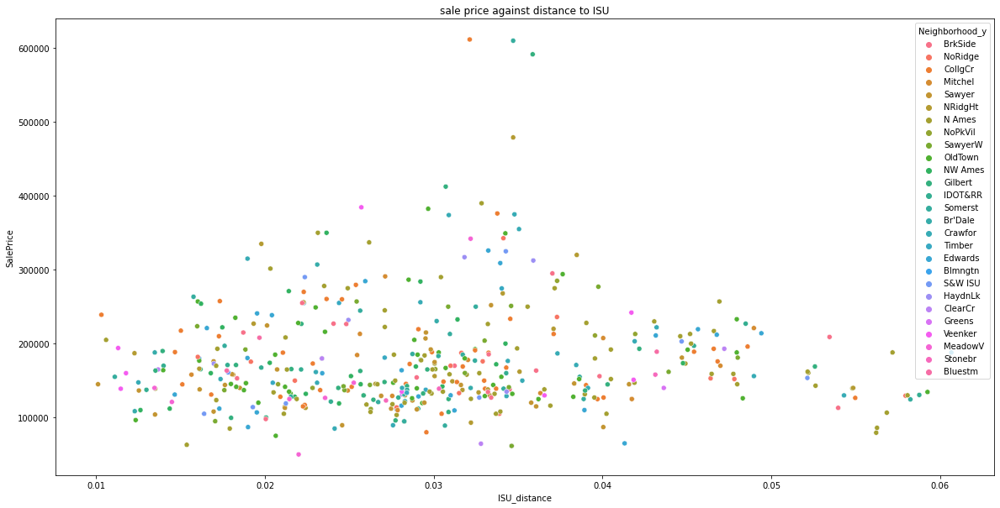

In [80]:
f, ax = plt.subplots(figsize=(20, 10))
x = sns.scatterplot(x=train.ISU_distance, y=train.SalePrice, hue=test['Neighborhood_y'])
x.set_title('sale price against distance to ISU')


Text(0.5, 1.0, 'sale price against longitude')

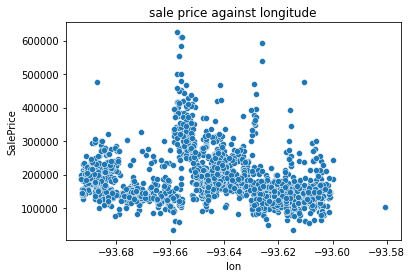

In [81]:
x = sns.scatterplot(x=train.lon, y=train.SalePrice)
x.set_title('sale price against longitude')

Text(0.5, 1.0, 'sale price against latitude')

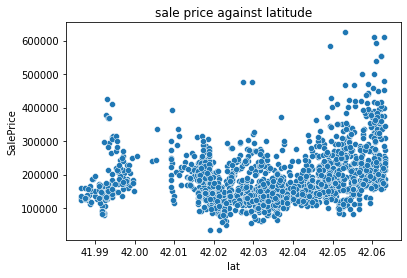

In [82]:
x = sns.scatterplot(x=train.lat, y=train.SalePrice)
x.set_title('sale price against latitude')

# limit search to only large parks

In [83]:
newpark["area"] = newpark['geometry'].area
newpark.sort_values('area', ascending=False)
largepark = newpark.sort_values('area', ascending=False).head(5)
largepark

,osm_id,name,type,geometry,area
2,44806238,Brookside Park,park,"POLYGON ((-93.63270 42.02849, -93.63212 42.028...",0.000042
4,44807182,Stuart Smith Park,park,"POLYGON ((-93.63219 42.01635, -93.63173 42.016...",0.000038
413,921759082,Izaak Walton League Park,park,"POLYGON ((-93.59520 42.04553, -93.58620 42.045...",0.000033
1,44804362,Moore Memorial Park,park,"POLYGON ((-93.64954 42.04537, -93.64954 42.045...",0.000022
65,188427943,North River Valley Park,park,"POLYGON ((-93.59717 42.03713, -93.59710 42.037...",0.000021


In [84]:
large_park_house_dist_train = largepark.geometry.apply(lambda g: train.distance(g))
large_park_house_dist_test = largepark.geometry.apply(lambda g: test.distance(g))


In [85]:
for i, row in train.iterrows():
    train.at[i,'nearest_large_park'] = large_park_house_dist_train[i].min()
    
for i, row in test.iterrows():
    test.at[i,'nearest_large_park'] = large_park_house_dist_test[i].min()

In [86]:
train.head()

,index,Unnamed: 0,MapRefNo,Neighborhood_x,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice,Prop_Addr,Neighborhood_y,Address,geometry,address,lon,lat,nearest_park,nearest_stream,ISU_distance,nearest_large_park
0,0,1736,923250210,Mitchel,988,21750,0,2,5,5,1954,1954,0.0,3,3,3,3,1,1,0.0,1,0.0,988.0,988.0,5,1,988,0,0,0.0,0.0,1,0,2,1,3,4,8,0,1954.0,2,2.0,520.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,113000,1976.0,57.186235,1.000000,0.0,22270.0,11502.443218,5.074091,11.635143,3714 S DUFF AVE,Mitchel,3714 S DUFF AVE Ames Iowa,POINT (-93.61007 41.98884),"3714, South Duff Avenue, Ames, Story County, I...",-93.610074,41.988843,0.007083,0.000680,0.053963,0.034400
1,1,1355,534177210,NWAmes,1242,9600,0,1,7,6,1973,1973,320.0,3,3,3,3,1,5,916.0,1,0.0,326.0,1242.0,2,1,1242,0,0,0.0,0.0,1,1,3,1,3,6,8,1,1973.0,1,2.0,528.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0

Text(0.5, 1.0, 'sale price against distance to nearest large park')

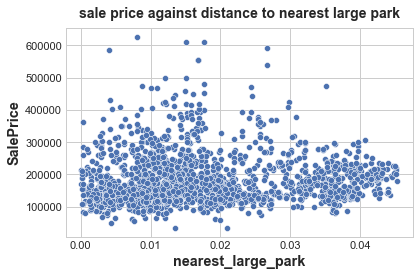

In [248]:
x = sns.scatterplot(train.nearest_large_park, train.SalePrice)
x.set_title('sale price against distance to nearest large park')

# explore by neighborhood

In [254]:
double = pd.concat([train, test])

In [88]:
# define neighborhoods
ontario = places[places['name'] == 'Ontario']
somerset = places[places['name'] == 'Somerset']
frederiksen = places[places['name'] == 'Frederiksen Court']
uniondrive = places[places['name'] == 'Union Drive']
richardson = places[places['name'] == 'Richardson Court']

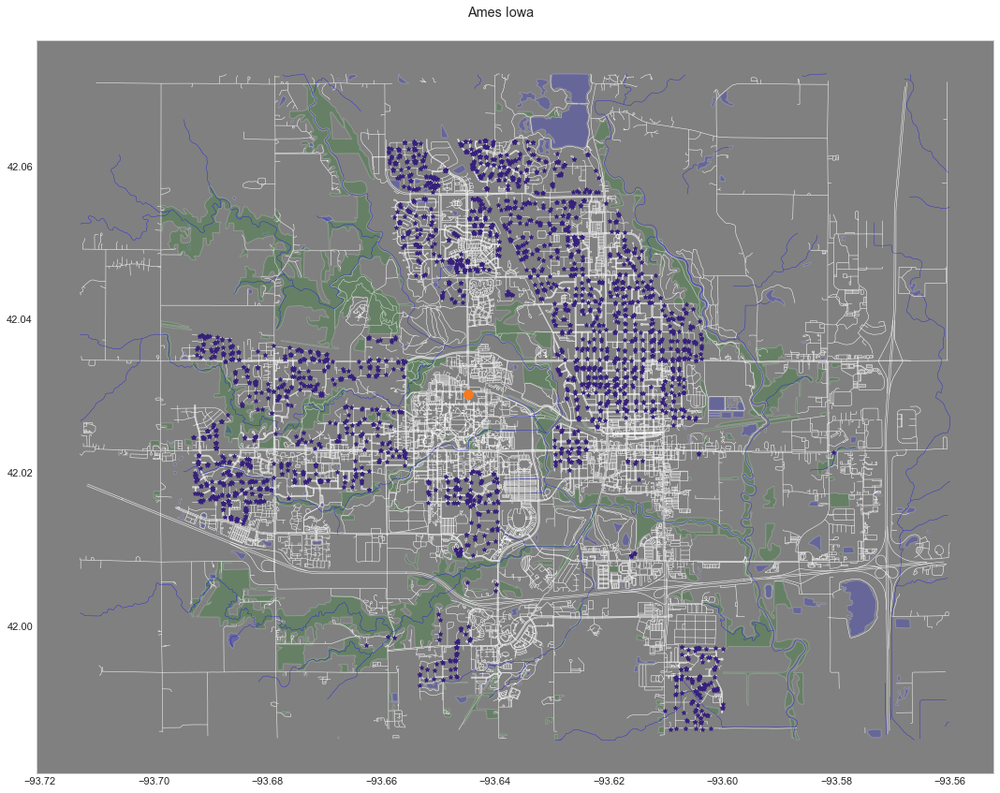

In [309]:
# first trying with coloring by neighborhood
fig,ax = plt.subplots(figsize=(15,12))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(ax=ax, marker='*', zorder=2, legend=True, color='#36207c', markersize=20)
# ontario.plot(ax=ax, marker='*', zorder=2, legend=True, color='purple', markersize=300)
# somerset.plot(ax=ax, marker='*', zorder=2, legend=True, color='purple', markersize=300)
# frederiksen.plot(ax=ax, marker='*', zorder=2, legend=True, color='purple', markersize=300)
# uniondrive.plot(ax=ax, marker='*', zorder=2, legend=True, color='purple', markersize=300)
# richardson.plot(ax=ax, marker='*', zorder=2, legend=True, color='purple', markersize=300)
waterways.plot(ax = ax, color='blue', linewidth=.3)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
#railways.plot(ax = ax, color='red', zorder=1)
#places.plot(ax = ax, color='purple', column='type', legend=True)
#buildings.plot(ax = ax, color='blue')
#landuse.plot(ax = ax, color='purple')
#points.plot(ax = ax, color='black')
nwater.plot(ax=ax, color='blue', zorder=1, alpha=.2)
nforest.plot(ax=ax, color='green', zorder=1, alpha=.2)
#npark.plot(ax=ax, color='red', zorder=1, alpha=.2)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
# iowa_state_center.plot(ax=ax, color = '#f47920', markersize=100)
# ames_high.plot(ax=ax, color = '#f47920', markersize=100, categorical=True,
#              legend=True)
pl.suptitle("Ames Iowa");


### explore by yearbuilt

Text(0.5, 0.98, 'Colored by Year built')

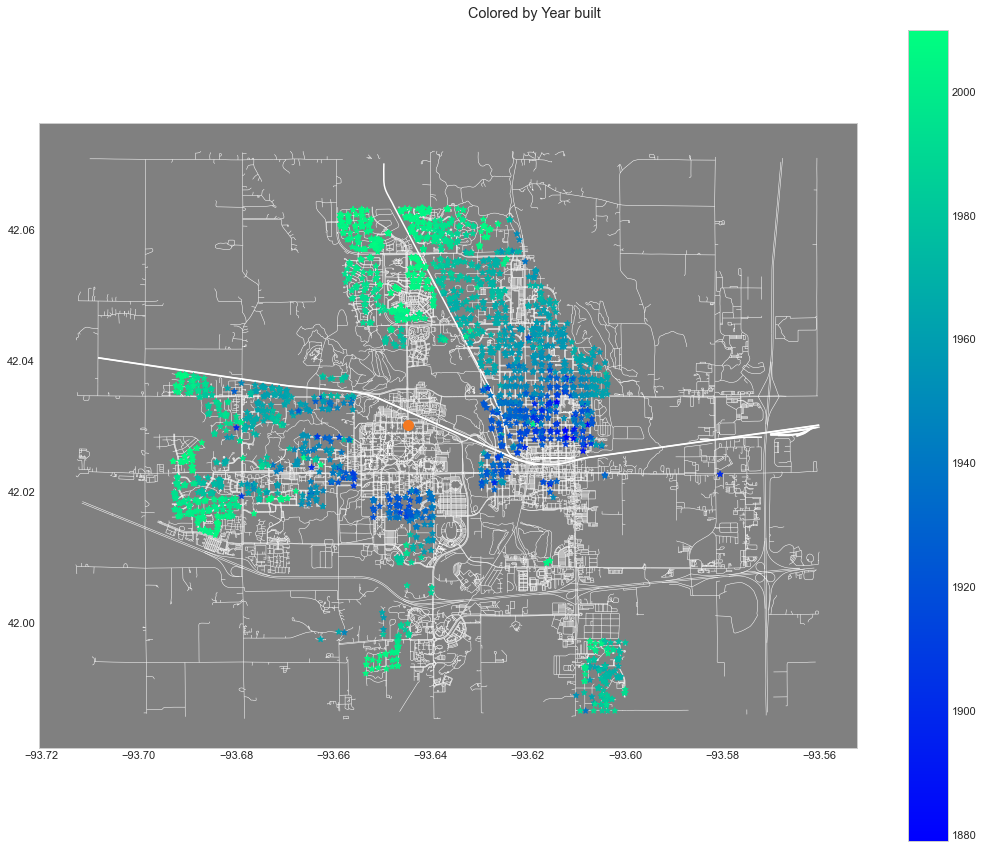

In [245]:
# first trying with coloring by neighborhood
fig,ax = plt.subplots(figsize=(15,12))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(ax=ax, marker='*', zorder=2, column='YearBuilt', legend=True, cmap="winter")
#waterways.plot(ax = ax, color='blue', linewidth=.3)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1)
#places.plot(ax = ax, color='purple', column='type', legend=True)
#buildings.plot(ax = ax, color='blue')
#landuse.plot(ax = ax, color='purple')
#points.plot(ax = ax, color='black')
#nwater.plot(ax=ax, color='#65bbc7', zorder=1)
#nforest.plot(ax=ax, color='green', zorder=1)
#npark.plot(ax=ax, color='#8B0000', zorder=1)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
# iowa_state_center.plot(ax=ax, color = '#f47920', markersize=100)
# ames_high.plot(ax=ax, color = '#f47920', markersize=100, categorical=True,
#              legend=True)
pl.suptitle("Colored by Year built")


# explore by everything

In [119]:
columns = list(train.columns)
columns

['index',
 'Unnamed: 0',
 'MapRefNo',
 'Neighborhood_x',
 'GrLivArea',
 'LotArea',
 'LotShape',
 'LandSlope',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'HeatingQC',
 'CentralAir',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MSSubClass_other',
 'MSSubClass_1-1/2 STORY FINISHED ALL AGES',
 'MSSubClass_1-STORY 1945 & OLDER',
 'MSSubClass_1-STORY 1946 & NEWER ALL STYLES',
 'MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER',
 'M

In [120]:
columns.remove('Address')
columns.remove('MapRefNo')
columns.remove('Unnamed: 0')
columns.remove('address')

In [125]:
# for i in columns:s
#     fig,ax = plt.subplots(figsize=(15,12))
#     train.plot(ax=ax, marker='*', zorder=2, column=i, legend=True, cmap="winter")
#     roads.plot(ax=ax, color='black', linewidth=0.5, zorder=1)
#     ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
#     pl.suptitle("Colored by " + i)
    
# IPython.OutputArea.auto_scroll_threshold = 9999;


In [126]:
# create neighborhood dataframe organized by mean saleprice 
# this is redundant and done again later, probably delete this
neighborhood_df = train[['MapRefNo', 'Neighborhood_y', 'YearBuilt', 'TotalSF', 'Price/SF']].groupby('Neighborhood_y').median()
neighborhood_df.head() 

,MapRefNo,YearBuilt,TotalSF,Price/SF
Neighborhood_y,,,,
Blmngtn,528228430.0,2005.0,2850.0,73.256319
Bluestm,909451150.0,1980.0,2016.0,76.536313
Br'Dale,527451140.0,1972.0,1617.0,63.359788
BrkSide,903228070.0,1930.0,2066.0,62.697576
ClearCr,905352105.0,1968.0,3037.5,74.705592


In [127]:
# group by neighborhood to get count and median_price of each neighborhood
neighborhood_df1 = train.groupby('Neighborhood_y').agg({'MapRefNo':'count', 'SalePrice':'median'}).rename(columns={'MapRefNo':'neighborhood_count', 'SalePrice':'neighborhood_median_price'}).reset_index().sort_values(by='neighborhood_median_price', ascending=False)
neighborhood_df1

,Neighborhood_y,neighborhood_count,neighborhood_median_price
10,HaydnLk,16,367209.5
15,NRidgHt,100,307500.0
18,NoRidge,52,301750.0
26,Veenker,15,255000.0
4,ClearCr,32,227500.0
23,Somerst,117,227000.0
25,Timber,45,220000.0
24,Stonebr,20,212750.0
5,CollgCr,187,198900.0
6,Crawfor,73,194000.0


In [128]:
neighborhood_medians = pd.merge(neighborhood_df, neighborhood_df1, on='Neighborhood_y').rename(columns={'Price/SF': 'neighborhood_Price/SF', 'TotalSF': 'neighborhood_TotalSF', 'YearBuilt': 'neighborhood_YearBuilt'}).sort_values(by='neighborhood_median_price', ascending=False)
neighborhood_medians = neighborhood_medians.drop(columns='MapRefNo')
neighborhood_medians

,Neighborhood_y,neighborhood_YearBuilt,neighborhood_TotalSF,neighborhood_Price/SF,neighborhood_count,neighborhood_median_price
10,HaydnLk,2005.5,3701.0,97.923281,16,367209.5
15,NRidgHt,2005.0,3493.0,88.295123,100,307500.0
18,NoRidge,1995.5,3761.0,83.705928,52,301750.0
26,Veenker,1980.0,2988.0,75.231948,15,255000.0
4,ClearCr,1968.0,3037.5,74.705592,32,227500.0
23,Somerst,2005.0,2782.0,82.036316,117,227000.0
25,Timber,2001.0,3002.0,79.269642,45,220000.0
24,Stonebr,1992.0,2910.5,74.446576,20,212750.0
5,CollgCr,2001.0,2606.0,75.843635,187,198900.0
6,Crawfor,1940.0,2618.0,73.979592,73,194000.0


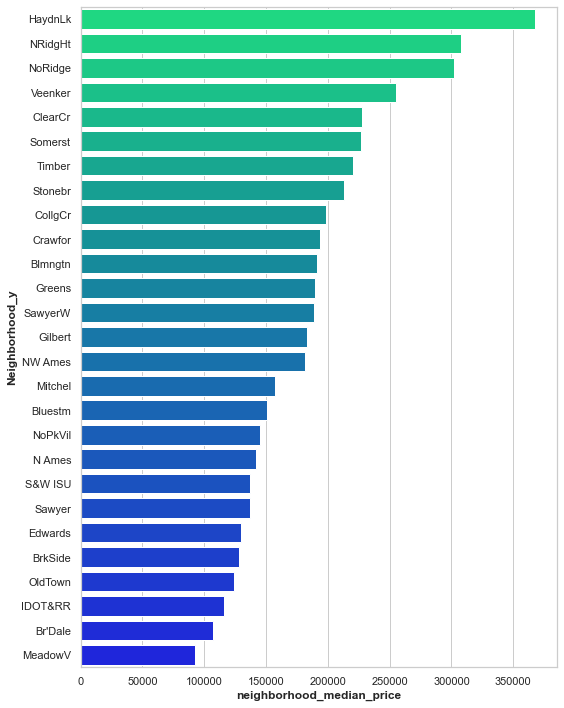

In [319]:
sns.set_theme(style="whitegrid")
f, ax = plt.subplots(figsize=(8, 10))
sns.barplot(data=neighborhood_medians, x='neighborhood_median_price', y='Neighborhood_y', orient='h', palette='winter_r');


In [130]:
# merge neighborhood dataframe back on to the houses dataframe to assign the median household price 
# of the neighborhood to each house in the neighborhood
trainnew = pd.merge(train, neighborhood_medians, on='Neighborhood_y')
testnew = pd.merge(test, neighborhood_medians, on='Neighborhood_y')
testnew.head()

,index,Unnamed: 0,MapRefNo,Neighborhood_x,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice,Prop_Addr,Neighborhood_y,Address,geometry,address,lon,lat,nearest_park,nearest_stream,ISU_distance,nearest_large_park,neighborhood_YearBuilt,neighborhood_TotalSF,neighborhood_Price/SF,neighborhood_count,neighborhood_median_price
0,0,898,903233100,BrkSide,1576,6240,0,1,5,6,1928,1950,0.0,3,3,3,3,1,1,0.0,1,0.0,1042.0,1042.0,5,1,1042,534,0,0.0,0.0,1,0,3,1,3,8,8,1,1928.0,1,1.0,225.0,3,3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,149000,2618.0,56.913675,1.000000,0.0,6465.0,-4434.109244,23.047177,11.911702,1015 HARDING AVE,BrkSide,1015 HARDING AVE Ames Iowa,POINT (-93.62152 42.03154),"1015, Harding Avenue, Ames, Story County, Iowa...",-93.621523,42.031542,0.006234,0.007464,0.023265,0.006234,1930.0,2066.0,62.697576,73,128500.0
1,60,1988,903236010,BrkSide,1285,8635,0,1,5,5,1948,2001,0.0,3,3,3,3,1,4,336.0,6,41.0,295.0,672.0,3,1,1072,213,0,1.0,0.0,1,0,2,1,3,6,7,0,1948.0,1,1.0,240.

In [316]:
# reverse colomap for consistency
orig_map=plt.cm.get_cmap('winter')
reversed_map = orig_map.reversed()

<AxesSubplot:>

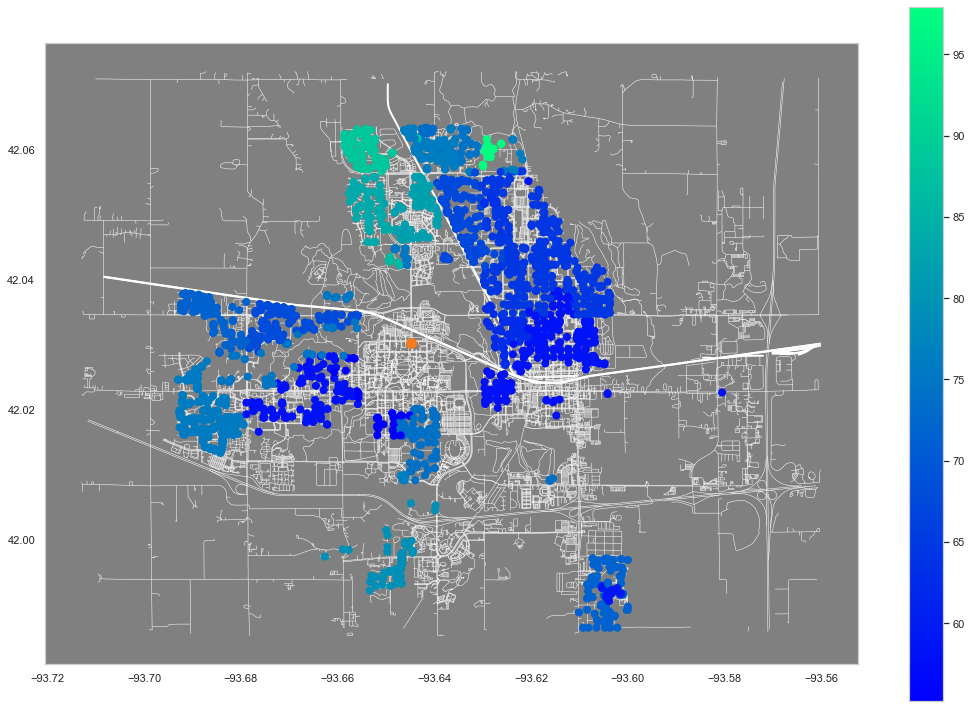

In [312]:
# coloring neighborhood by median neighborhood $/SF
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
#dfnew.plot(ax=ax, marker='*', zorder=2, column='mean_price', colorbar=True)
double.plot(column='neighborhood_Price/SF', ax=ax, legend=True, markersize=50, cmap='winter', zorder=2)
#waterways.plot(ax = ax, color='blue', linewidth=.3)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=2)
#places.plot(ax = ax, color='purple', column='type', legend=True)
#buildings.plot(ax = ax, color='blue')
#landuse.plot(ax = ax, color='purple')
#points.plot(ax = ax, color='black')
#nwater.plot(ax=ax, color='#65bbc7', zorder=1)
#nforest.plot(ax=ax, color='green', zorder=1)
#npark.plot(ax=ax, color='#8B0000', zorder=1)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
# iowa_state_center.plot(ax=ax, color = '#f47920', markersize=100)
# ames_high.plot(ax=ax, color = '#f47920', markersize=100, categorical=True,
#              legend=True)

# add new neighborhood features

In [255]:
trainnew['TotalSf-NSF'] = trainnew['TotalSF'] - trainnew['neighborhood_TotalSF']
trainnew['Price/SF-NPrice/SF'] = trainnew['Price/SF'] - trainnew['neighborhood_Price/SF']
trainnew['SalePrice-NMedPrice'] = trainnew['SalePrice'] - trainnew['neighborhood_median_price']
trainnew['YearBuilt-NYearBuilt'] = trainnew['YearBuilt'] - trainnew['neighborhood_YearBuilt']

testnew['TotalSf-NSF'] = testnew['TotalSF'] - testnew['neighborhood_TotalSF']
testnew['Price/SF-NPrice/SF'] = testnew['Price/SF'] - testnew['neighborhood_Price/SF']
testnew['SalePrice-NMedPrice'] = testnew['SalePrice'] - testnew['neighborhood_median_price']
testnew['YearBuilt-NYearBuilt'] = testnew['YearBuilt'] - testnew['neighborhood_YearBuilt']

In [256]:
double = pd.concat([trainnew, testnew])

# Construct Final Maps

In [ ]:
# releveant columns for mapping

# Year built
# Neighborhood
# Overall quality
# Mason Vnr Area
# Exterior quality
# Full Bath
# Kitchen Quality
# Fireplaces
# Garage cars
# Ext vinyl siding
# Foundation cblock
# Foundation pconc
# price/SF
# Log saleprice

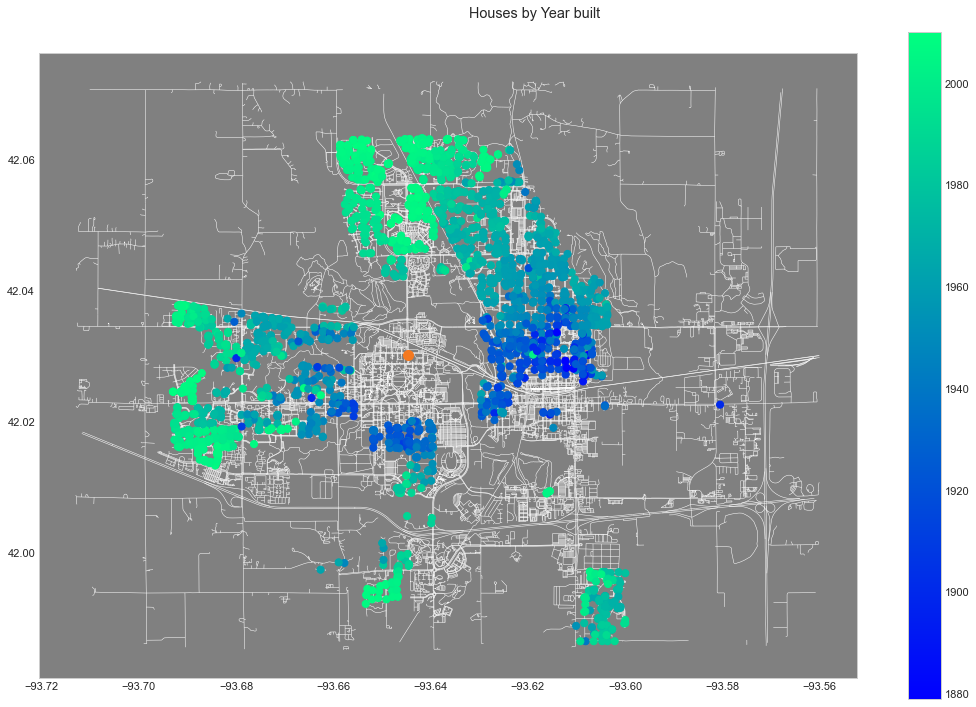

In [307]:
# coloring houses by Year Built
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='YearBuilt', ax=ax, legend=True, markersize=50, cmap='winter', zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by Year built");

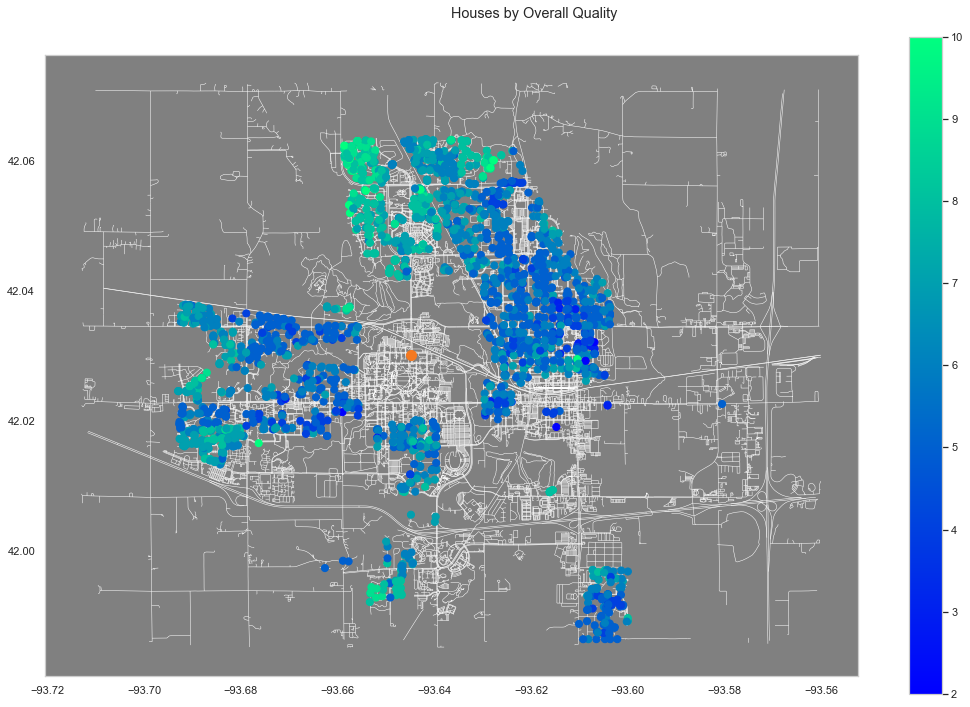

In [323]:
# coloring houses by Overall Quality
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='OverallQual', ax=ax, legend=True, markersize=50, cmap='winter', zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by Overall Quality");

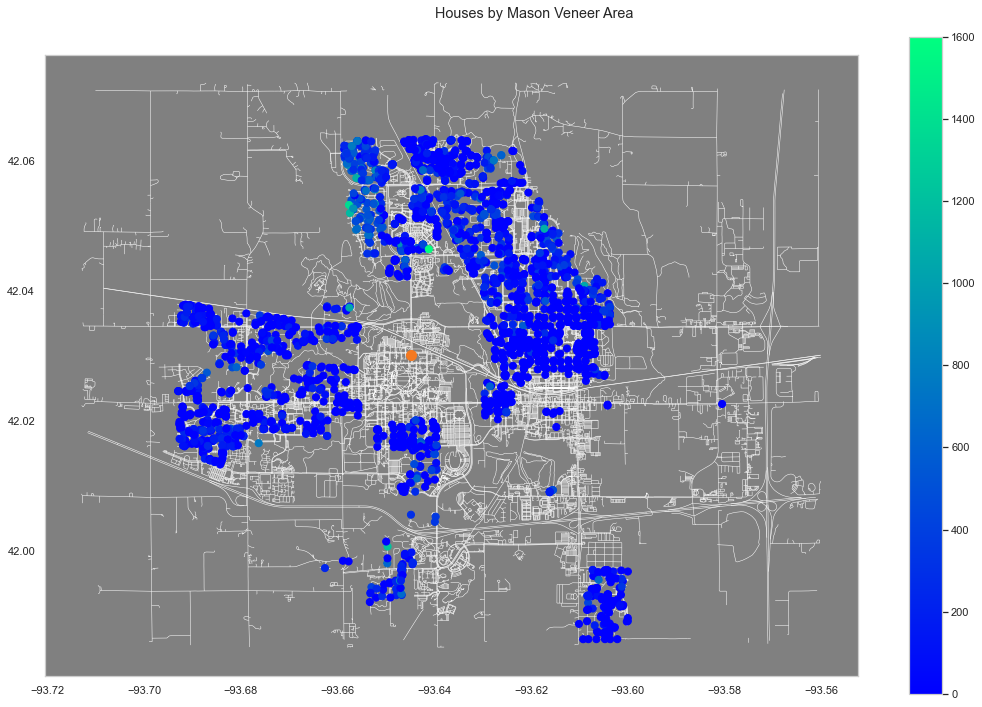

In [324]:
# coloring houses by MasonVnrArea
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='MasVnrArea', ax=ax, legend=True, markersize=50, cmap='winter', zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by Mason Veneer Area");

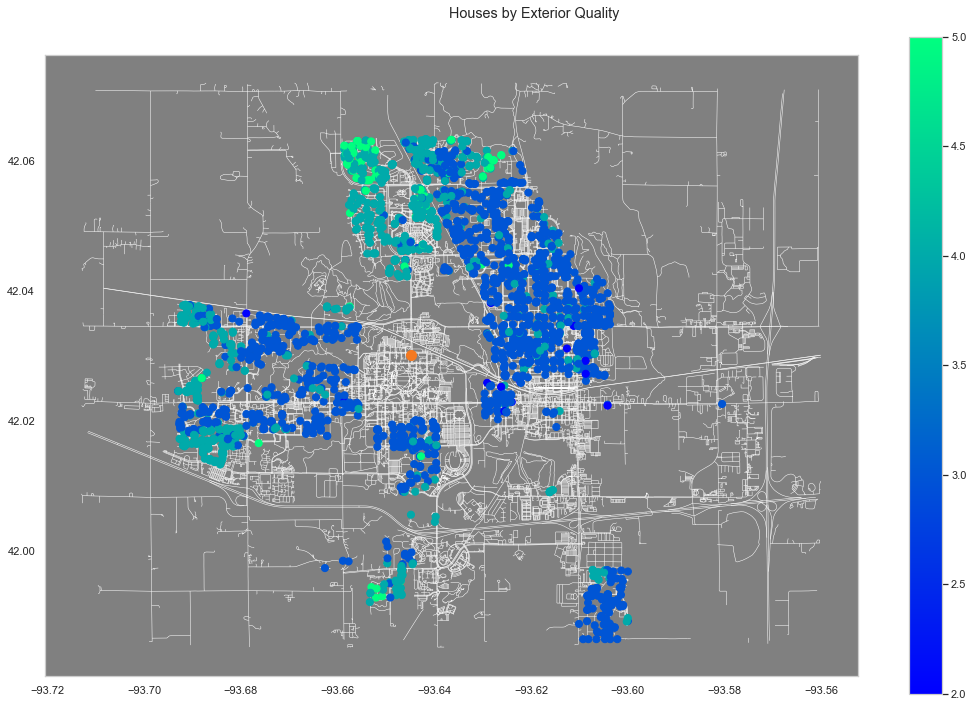

In [325]:
# coloring houses by Exterior Quality
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='ExterQual', ax=ax, legend=True, markersize=50, cmap='winter', zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by Exterior Quality");

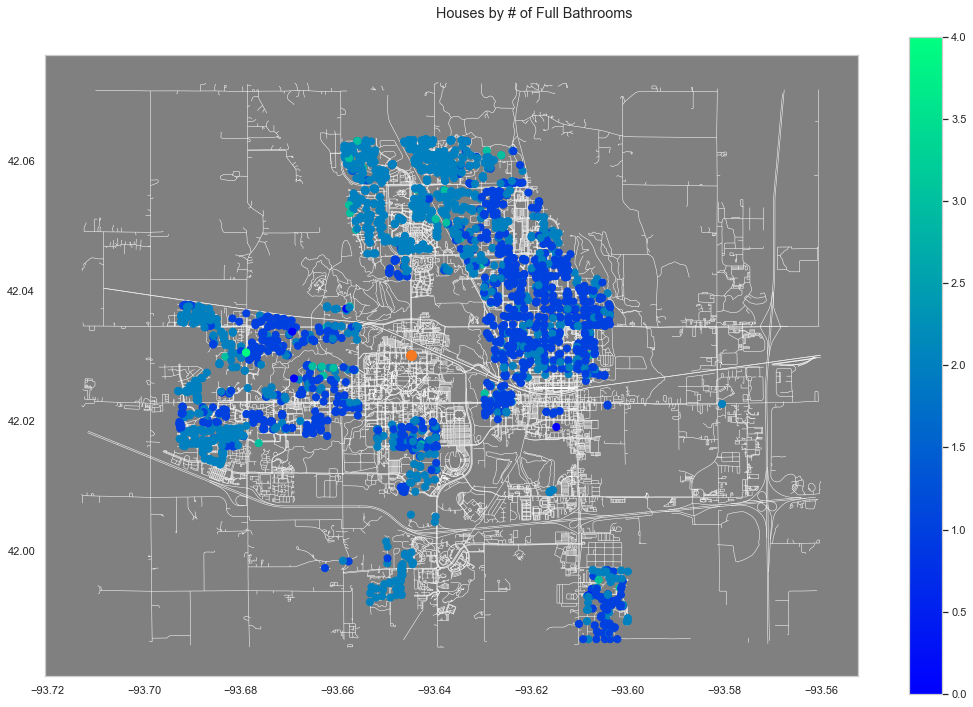

In [326]:
# coloring houses by Full Bath
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='FullBath', ax=ax, legend=True, markersize=50, cmap="winter", zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by # of Full Bathrooms");

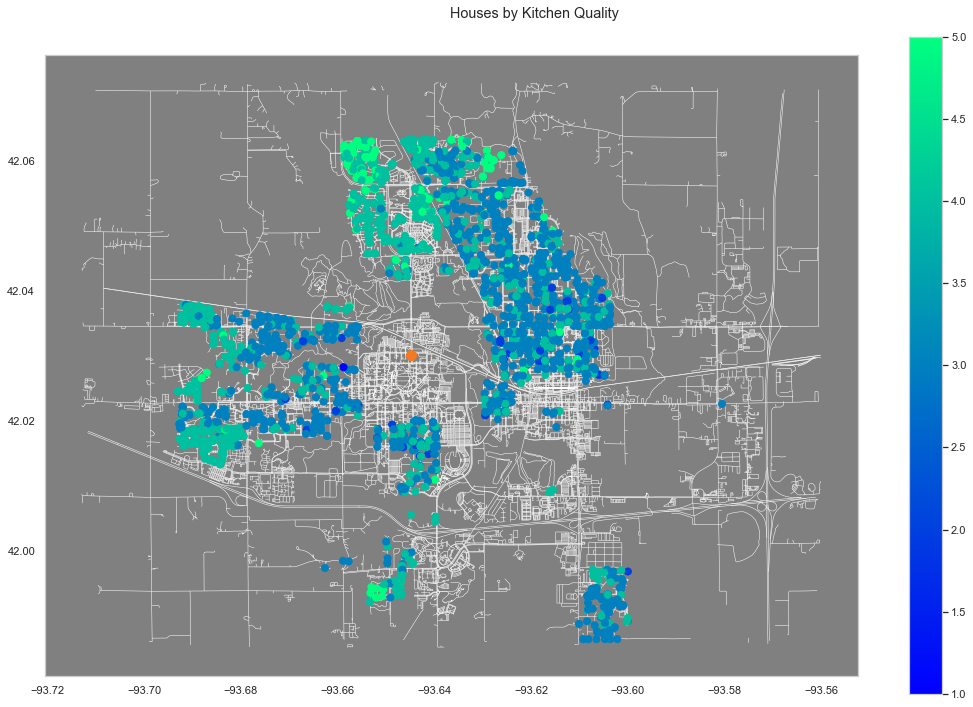

In [327]:
# coloring houses by Kitchen Quality
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='KitchenQual', ax=ax, legend=True, markersize=50, cmap='winter', zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by Kitchen Quality");

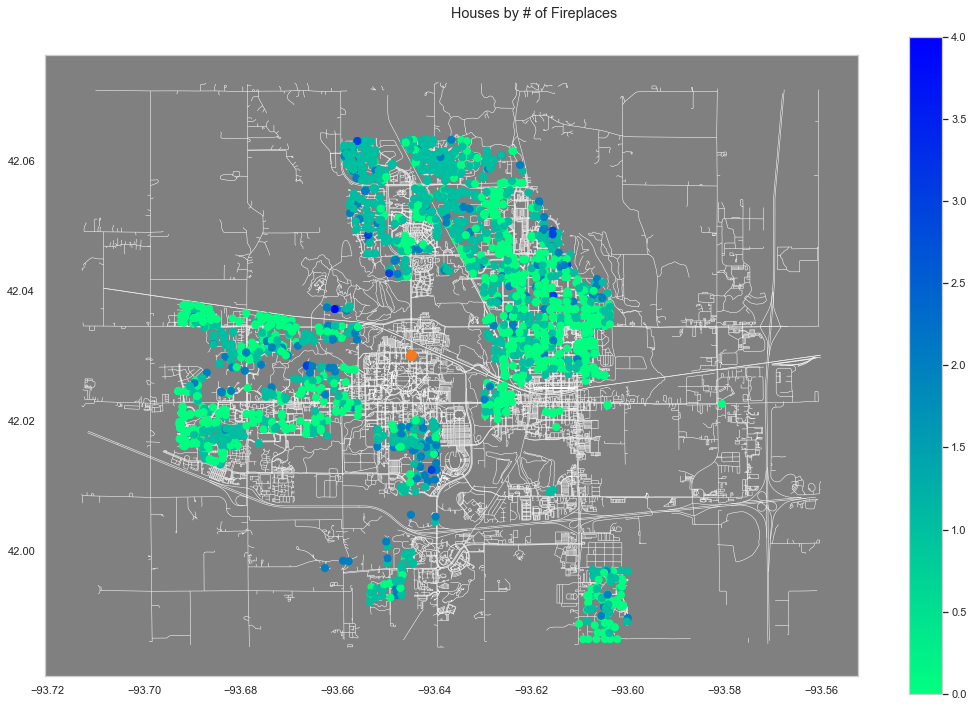

In [329]:
# coloring houses by Fireplaces
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='Fireplaces', ax=ax, legend=True, markersize=50, cmap=reversed_map, zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by # of Fireplaces");

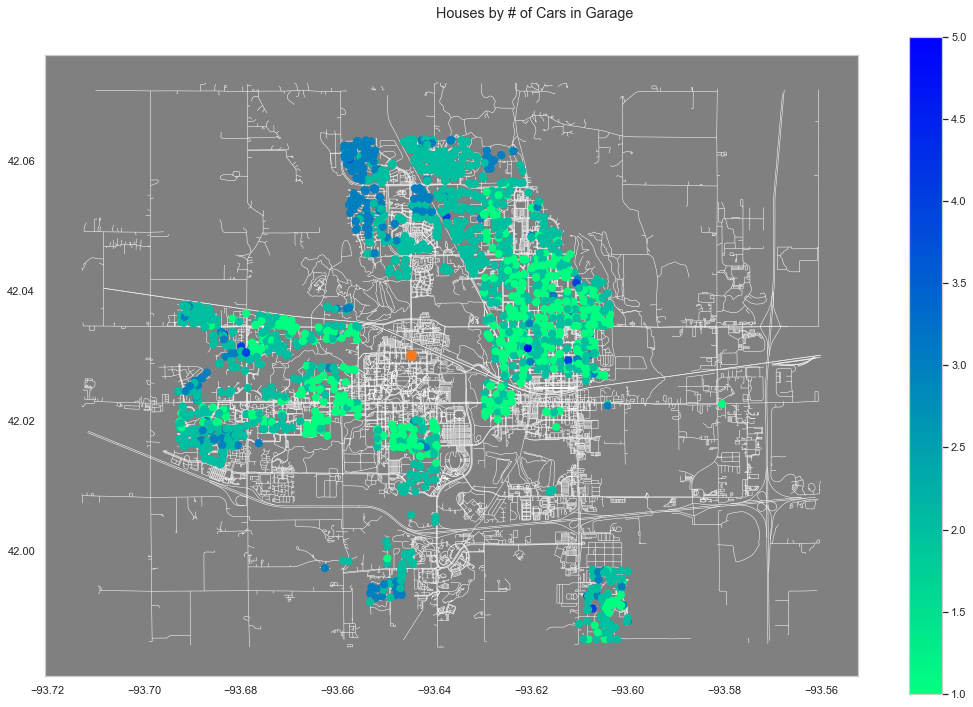

In [331]:
# coloring houses by Garage Cars
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='GarageCars', ax=ax, legend=True, markersize=50, cmap=reversed_map, zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by # of Cars in Garage");

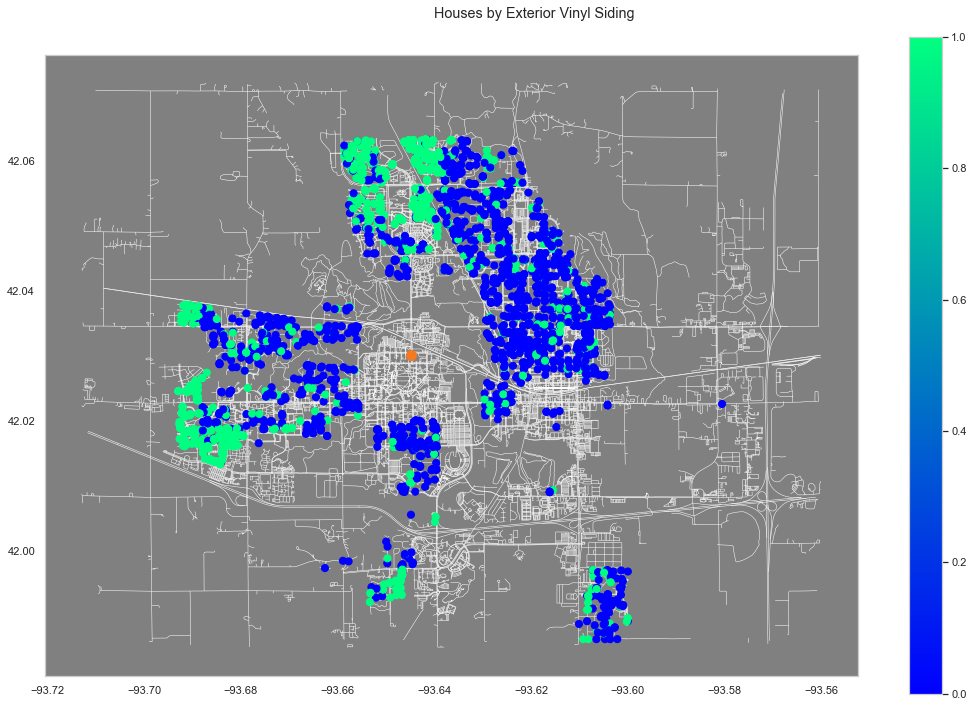

In [332]:
# coloring houses by exterior vinyl siding
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='Exterior1st_VinylSd', ax=ax, legend=True, markersize=50, cmap='winter', zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by Exterior Vinyl Siding");

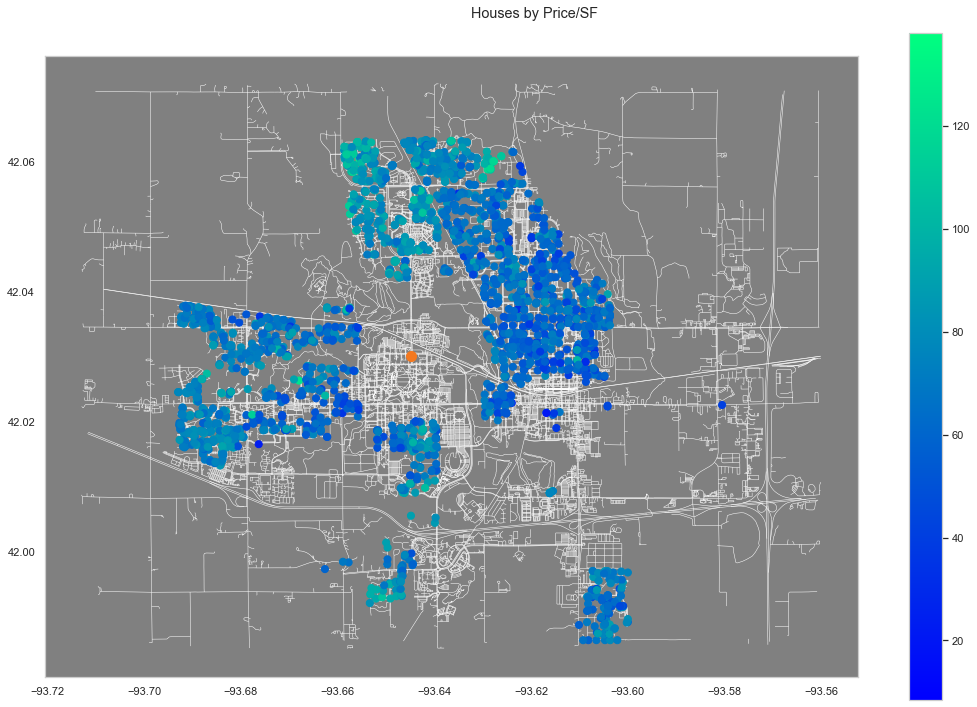

In [334]:
# coloring houses by price/SF
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='Price/SF', ax=ax, legend=True, markersize=50, cmap='winter', zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by Price/SF");

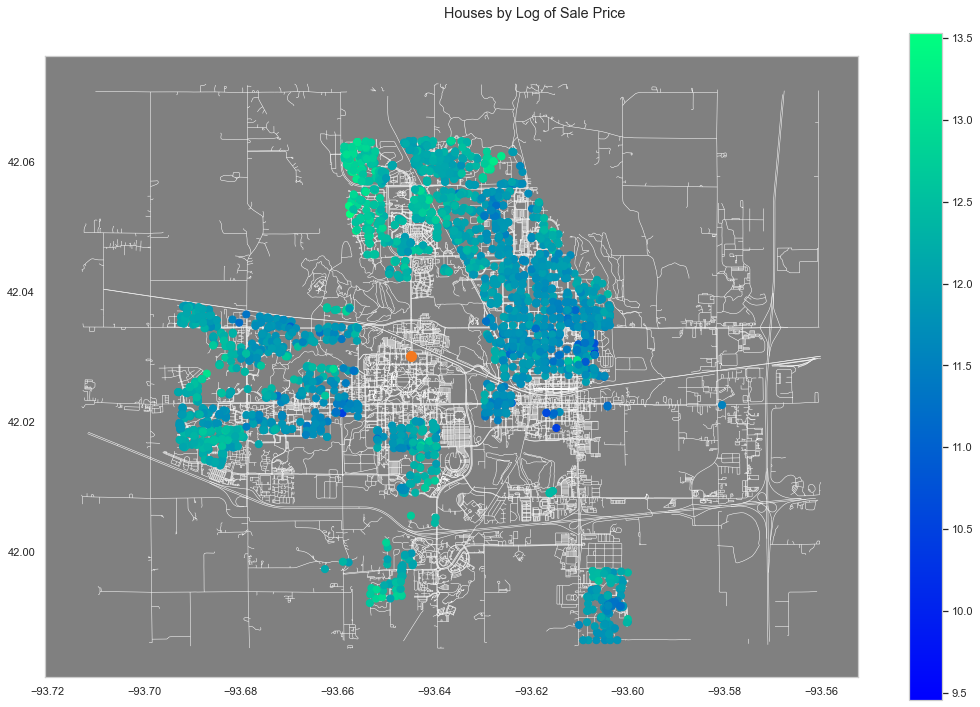

In [335]:
# coloring houses by log sale price
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='LogSalePrice', ax=ax, legend=True, markersize=50, cmap='winter', zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by Log of Sale Price");

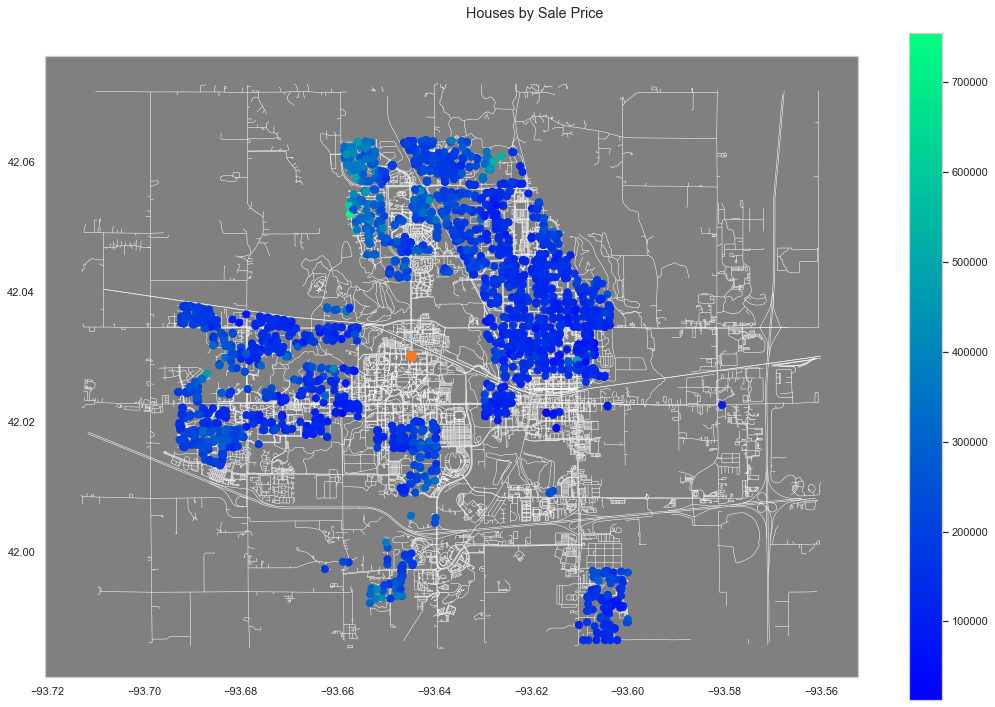

In [336]:
# coloring houses by SalePrice
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='SalePrice', ax=ax, legend=True, markersize=50, cmap='winter', zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Houses by Sale Price");

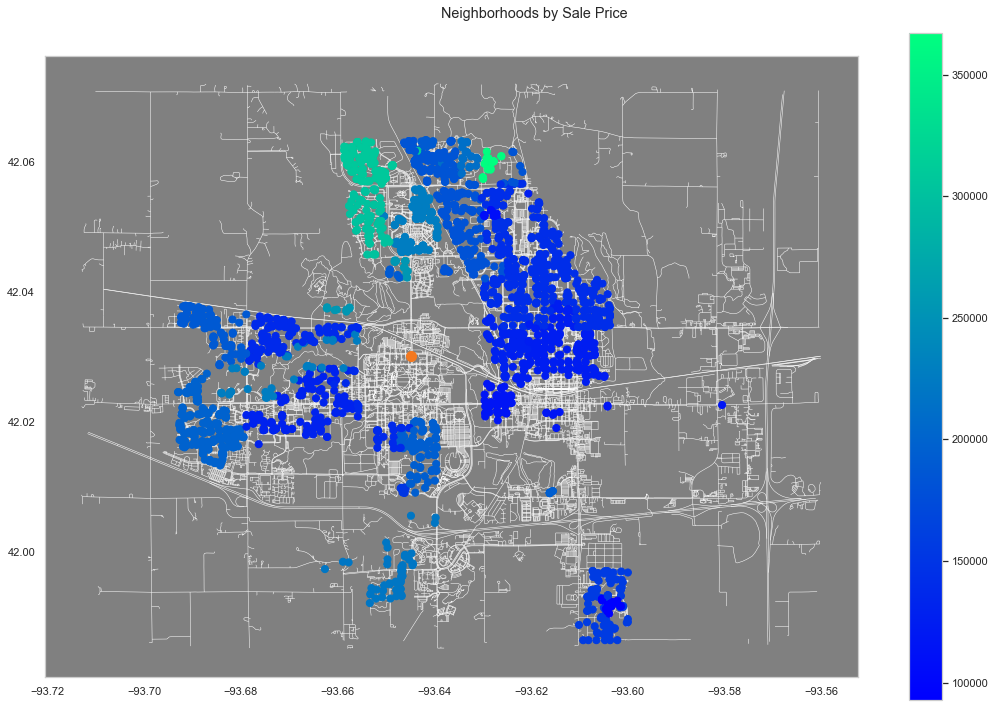

In [337]:
# coloring Neighborhoods by median SalePrice
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
double.plot(column='neighborhood_median_price', ax=ax, legend=True, markersize=50, cmap='winter', zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
railways.plot(ax = ax, color='white', zorder=1, linewidth=.5)
ISU.plot(ax=ax, color = '#f47920', markersize=100, zorder=2)
pl.suptitle("Neighborhoods by Sale Price");

# Write new dataframes to CSV for my dude, Robert

In [135]:
geoTRAIN = trainnew.copy()
geoTEST = testnew.copy()

In [136]:
geoTRAIN.to_csv('../Data_Master/geoTRAIN.csv')
geoTEST.to_csv('../Data_Master/geoTEST.csv')

## Questions for Luke


Project Goal:
__Perform a descriptive analysis of the Ames housing market with an emphasis on location. Used for buyers to assess realistic expectations of price for the features they want.__


1. help us clarify our goal for the project


2. multicolinearity (square footage/# of rooms - proximity to certain features/neighborhood)


3. handling null values and zeroes


4. within group analysis: validity of clustering houses into groups then running regressions within groups
        
        a. cluster based on median price brackets, neighborhoods, kmeans??

5. clever ways of assessing proximities as a feature

## Responses

1.


2. Log transform the y.  Lasso for feature selection. 

handling yr features, log


3. zeroes: use lasso for feature selection rather than splitting data into multiple gruops.

null: knn imputation (use similar variables to predict null value) or mean imputation


4. include proximity against price per square foot

census data for median income by neighborhood.  Use this to group neighborhoods.  Or use kmeans for clustering.  

Dummify neighborhood than use this to predict saleprice with lasso

what features differentiate the neighborhood/groups


5.cluster by kmeans including coordinates

maybe focus on two features, 


# implementing decision trees on coordinates for neighborhood grouping

NameError: name 'df' is not defined

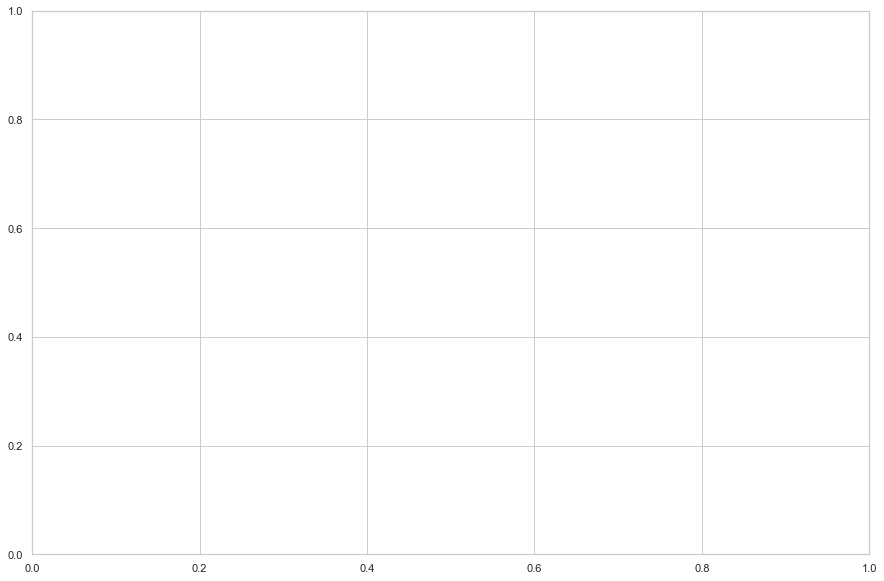

In [94]:
fig,ax = plt.subplots(figsize=(15,10))
sns.scatterplot(data=df, x='lon', y='lat', hue='SalePrice_x')

In [ ]:
import matplotlib.pyplot as plt
from PlotFunctions import plot_model
from sklearn.metrics import confusion_matrix
from collections import Counter
import math

from sklearn import tree
tree_model = tree.DecisionTreeClassifier()

def purity(L, metric='gini'):
    total = len(L)
    freq = map(lambda x: float(x) / total, list(Counter(L).values()))
    if metric == 'gini':
        scores = map(lambda x: x * (1 - x), freq)
    elif metric == 'entropy':
        scores = map(lambda x: -x * math.log(x, 2), freq)
    return sum(scores)

In [ ]:
test = df.head(50)

In [ ]:
# create a price bin for grouping houses by saleprice
test['priceBin'] = pd.cut(test.SalePrice_x, 8, labels=False)
test

In [ ]:
tree_model.fit(test.loc[1][:, -5:-6], test.loc[1].priceBin)

In [ ]:
test.loc[1][:]

# Kmeans a good time

In [372]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True)
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)

In [373]:
merged = pd.concat([train, test])

In [374]:
merged.head()

,index,Unnamed: 0,MapRefNo,Neighborhood_x,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice,Prop_Addr,Neighborhood_y,Address,geometry,address,lon,lat,nearest_park,nearest_stream,ISU_distance,nearest_large_park
0,0,1736,923250210,Mitchel,988,21750,0,2,5,5,1954,1954,0.0,3,3,3,3,1,1,0.0,1,0.0,988.0,988.0,5,1,988,0,0,0.0,0.0,1,0,2,1,3,4,8,0,1954.0,2,2.0,520.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,113000,1976.0,57.186235,1.000000,0.0,22270.0,11502.443218,5.074091,11.635143,3714 S DUFF AVE,Mitchel,3714 S DUFF AVE Ames Iowa,POINT (-93.61007 41.98884),"3714, South Duff Avenue, Ames, Story County, I...",-93.610074,41.988843,0.007083,0.000680,0.053963,0.034400
1,1,1355,534177210,NWAmes,1242,9600,0,1,7,6,1973,1973,320.0,3,3,3,3,1,5,916.0,1,0.0,326.0,1242.0,2,1,1242,0,0,0.0,0.0,1,1,3,1,3,6,8,1,1973.0,1,2.0,528.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0

In [375]:
X = merged.loc[:, ["MapRefNo", "lon", "lat", "SalePrice"]]
# should I stay away from saleprice?  Should I focus on lon, lat, neighborhoodsaleprice, yearbuilt, TotalSF?

In [376]:
X.head()

,MapRefNo,lon,lat,SalePrice
0,923250210,-93.610074,41.988843,113000
1,534177210,-93.631309,42.043849,175500
2,528228540,-93.641569,42.063284,187687
3,534275010,-93.623531,42.043228,136500
4,907290170,-93.681211,42.016284,143750


In [377]:
# standardize data
scaler = StandardScaler()

X[['lon', 'lat', 'SalePrice']] = scaler.fit_transform(X[['lon', 'lat', 'SalePrice']])

X.head()
# just double checking

,MapRefNo,lon,lat,SalePrice
0,923250210,1.274366,-2.534702,-0.928650
1,534177210,0.449480,0.488779,-0.100429
2,528228540,0.050946,1.557048,0.061068
3,534275010,0.751618,0.454637,-0.617239
4,907290170,-1.488973,-1.026375,-0.521165


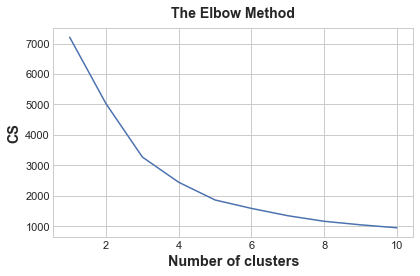

In [378]:
from sklearn.cluster import KMeans
cs = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(X[['lon', 'lat', 'SalePrice']])
    cs.append(kmeans.inertia_)
plt.plot(range(1, 11), cs)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('CS')
plt.show()

In [379]:
kmeans = KMeans(n_clusters=5)
X["Cluster"] = kmeans.fit_predict(X[['lon', 'lat', 'SalePrice']])
X["Cluster"] = X["Cluster"].astype("category")

X.head()

,MapRefNo,lon,lat,SalePrice,Cluster
0,923250210,1.274366,-2.534702,-0.928650,2
1,534177210,0.449480,0.488779,-0.100429,0
2,528228540,0.050946,1.557048,0.061068,1
3,534275010,0.751618,0.454637,-0.617239,0
4,907290170,-1.488973,-1.026375,-0.521165,3


In [380]:
merged = merged.merge(X[['MapRefNo', 'Cluster']], on='MapRefNo')

In [381]:
merged.columns

Index(['index', 'Unnamed: 0', 'MapRefNo', 'Neighborhood_x', 'GrLivArea',
       'LotArea', 'LotShape', 'LandSlope', 'OverallQual', 'OverallCond',
       ...
       'Address', 'geometry', 'address', 'lon', 'lat', 'nearest_park',
       'nearest_stream', 'ISU_distance', 'nearest_large_park', 'Cluster'],
      dtype='object', length=186)

Text(0.5, 0.98, 'Clustered by Latitude, Longitude, and Sale Price')

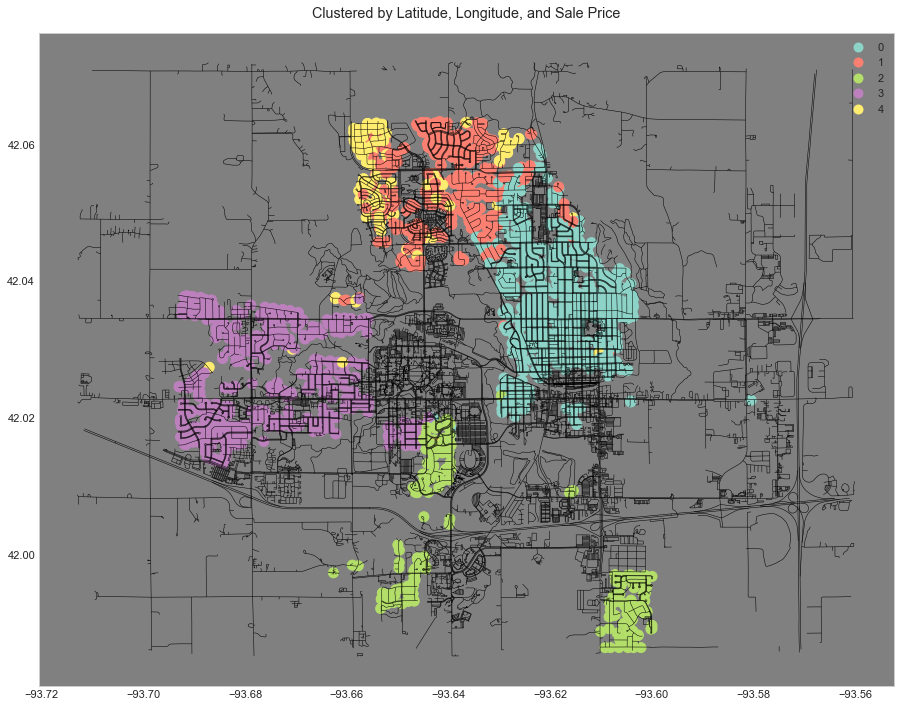

In [382]:
# coloring neighborhood by median neighborhood house price
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
merged.plot(ax=ax, legend=True, markersize=100, column='Cluster', cmap='Set3')
roads.plot(ax=ax, color='black', linewidth=0.5, zorder=1)
pl.suptitle("Clustered by Latitude, Longitude, and Sale Price")


In [383]:
import plotly.express as px

fig = px.box(merged, x='Cluster', y='LogSalePrice')
fig.show()

In [384]:
cluster0 = merged[merged['Cluster'] == 0]
cluster1 = merged[merged['Cluster'] == 1]
cluster2 = merged[merged['Cluster'] == 2]
cluster3 = merged[merged['Cluster'] == 3]
cluster4 = merged[merged['Cluster'] == 4]

In [385]:
cluster0 = pd.DataFrame(cluster0.mean())
cluster1 = pd.DataFrame(cluster1.mean())
cluster2 = pd.DataFrame(cluster2.mean())
cluster3 = pd.DataFrame(cluster3.mean())
cluster4 = pd.DataFrame(cluster4.mean())

In [386]:
cluster0.loc['SalePrice']

0    134200.59601
Name: SalePrice, dtype: float64

In [387]:
clusters = pd.merge(cluster0, cluster1, left_index=True, right_index=True).rename(columns={'0_x':'0', '0_y':1})
clusters = pd.merge(clusters, cluster2, left_index=True, right_index=True).rename(columns={0:'2'})
clusters = pd.merge(clusters, cluster3, left_index=True, right_index=True).rename(columns={0:'3'})
clusters = pd.merge(clusters, cluster4, left_index=True, right_index=True).rename(columns={0:'4'})
clusters

,0,1,2,3,4
index,7.888691e+02,8.188029e+02,7.837483e+02,8.129813e+02,8.042000e+02
Unnamed: 0,1.219525e+03,1.177391e+03,1.206650e+03,1.202611e+03,1.002538e+03
MapRefNo,6.780324e+08,5.305734e+08,9.162468e+08,8.435714e+08,5.403340e+08
GrLivArea,1.297086e+03,1.639247e+03,1.483003e+03,1.423663e+03,2.337488e+03
LotArea,8.601384e+03,9.399864e+03,1.186976e+04,1.082717e+04,1.401838e+04
...,...,...,...,...,...
lat,4.203745e+01,4.205423e+01,4.200108e+01,4.202517e+01,4.205571e+01
nearest_park,4.332566e-03,2.863115e-03,3.107325e-03,6.153498e-03,5.170406e-03
nearest_stream,8.678588e-03,6.889663e-03,2.676217e-03,3.076050e-03,4.869903e-03
ISU_distance,2.805966e-02,2.568133e-02,3.781862e-02,3.339236e-02,2.882543e-02


In [388]:
# trying again, but clustering based on different features
X = merged.loc[:, ["MapRefNo", "lon", "lat", "YearBuilt", 'TotalSF']]
# should I stay away from saleprice?  Should I focus on lon, lat, neighborhoodsaleprice, yearbuilt, TotalSF?

In [389]:
# standardize data
scaler = StandardScaler()

X[['lon', 'lat', 'YearBuilt', 'TotalSF']] = scaler.fit_transform(X[['lon', 'lat', 'YearBuilt', 'TotalSF']])

X.head()
# just double checking

,MapRefNo,lon,lat,YearBuilt,TotalSF
0,923250210,1.266363,-2.511164,-0.620215,-0.792081
1,534177210,0.442005,0.494820,0.037908,-0.114955
2,528228540,0.043725,1.556907,1.215601,-0.237584
3,534275010,0.743950,0.460875,-0.377749,-0.626798
4,907290170,-1.495210,-1.011566,1.077049,-1.165301


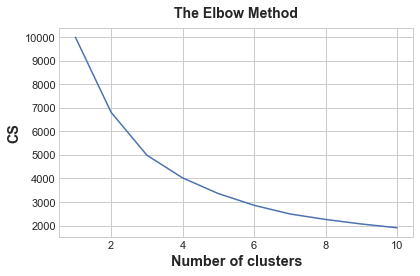

In [390]:
from sklearn.cluster import KMeans
cs = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(X[['lon', 'lat', 'YearBuilt', 'TotalSF']])
    cs.append(kmeans.inertia_)
plt.plot(range(1, 11), cs)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('CS')
plt.show()

In [391]:
kmeans = KMeans(n_clusters=6)
X["Cluster"] = kmeans.fit_predict(X[['lon', 'lat', 'YearBuilt', 'TotalSF']])
X["Cluster"] = X["Cluster"].astype("category")

X.head()

,MapRefNo,lon,lat,YearBuilt,TotalSF,Cluster
0,923250210,1.266363,-2.511164,-0.620215,-0.792081,2
1,534177210,0.442005,0.494820,0.037908,-0.114955,4
2,528228540,0.043725,1.556907,1.215601,-0.237584,5
3,534275010,0.743950,0.460875,-0.377749,-0.626798,4
4,907290170,-1.495210,-1.011566,1.077049,-1.165301,1


In [392]:
merged = merged.merge(X[['MapRefNo', 'Cluster']], on='MapRefNo')

In [393]:
merged

,index,Unnamed: 0,MapRefNo,Neighborhood_x,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice,Prop_Addr,Neighborhood_y,Address,geometry,address,lon,lat,nearest_park,nearest_stream,ISU_distance,nearest_large_park,Cluster_x,Cluster_y
0,0,1736,923250210,Mitchel,988,21750,0,2,5,5,1954,1954,0.0,3,3,3,3,1,1,0.0,1,0.0,988.0,988.0,5,1,988,0,0,0.0,0.0,1,0,2,1,3,4,8,0,1954.0,2,2.0,520.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,113000,1976.0,57.186235,1.000000,0.0,22270.0,11502.443218,5.074091,11.635143,3714 S DUFF AVE,Mitchel,3714 S DUFF AVE Ames Iowa,POINT (-93.61007 41.98884),"3714, South Duff Avenue, Ames, Story County, I...",-93.610074,41.988843,0.007083,0.000680,0.053963,0.034400,2,2
1,1,1355,534177210,NWAmes,1242,9600,0,1,7,6,1973,1973,320.0,3,3,3,3,1,5,916.0,1,0.0,326.0,1242.0,2,1,1242,0,0,0.0,0.0,1,1,3,1,3,6,8,1,1973.0,1,2.0,528.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1

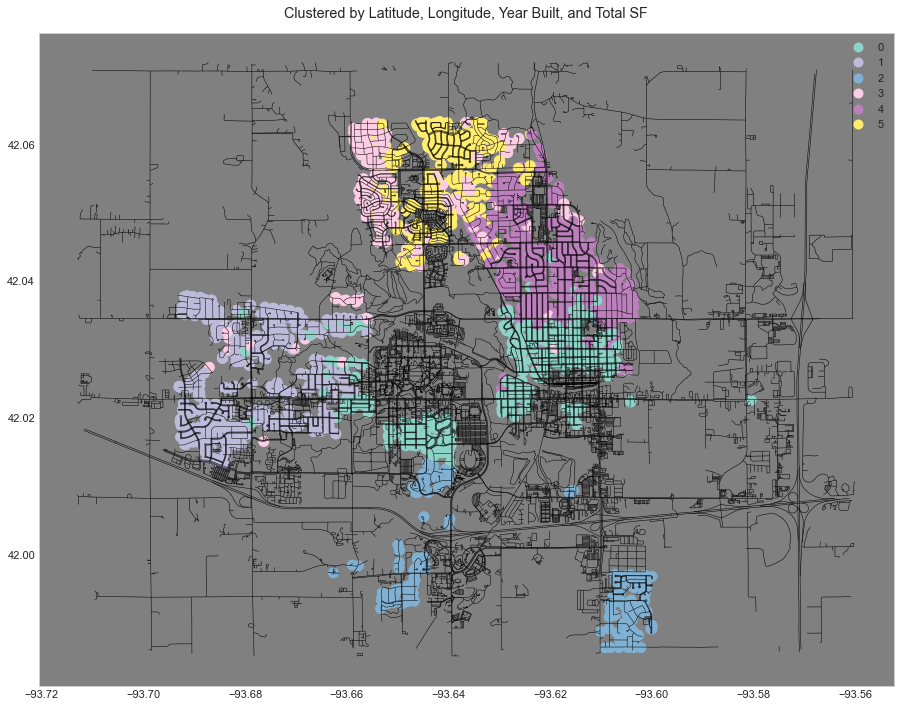

In [394]:
# coloring neighborhood by median neighborhood house price
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
merged.plot(ax=ax, legend=True, markersize=100, column='Cluster_y', cmap='Set3')
roads.plot(ax=ax, color='black', linewidth=0.5, zorder=1)
pl.suptitle("Clustered by Latitude, Longitude, Year Built, and Total SF");

In [395]:
import plotly.express as px

fig = px.box(merged, x='Cluster_y', y='LogSalePrice')
fig.show()

Ideas for interactive features for buyers:

1. price estimate feature: given desired features, what price range should I expect?  Run a multiple linear regression, get the coefs of each variable, then for the remaining features, impute the median values of the neighborhood.  Read back the regression's guess for price range.  Include confidence interval?

2. filter feature: filter available houses by desired features.  Display houses that match the filter.  If fewer then 10 houses match the filter, tell the user something like, "There are only 4 houses that match your filter.  Here are 10 other similar houses." and this would include houses that match the filter the most.  
        To decide what matches most, rank each feature by its feature importance.  To decided which house should be shown, show all houses that have all but 1 of the requested features.  Then of those houses, rank them in order of the feature importance (for example, if one is in the neighborhood but doesn't have a porch, and the other has a porch but isn't in the neighborhood, show the first one because neighborhood is ranked higher than porch as a feature.

# filter feature

In [160]:
train.columns

Index(['index', 'Unnamed: 0', 'MapRefNo', 'Neighborhood_x', 'GrLivArea',
       'LotArea', 'LotShape', 'LandSlope', 'OverallQual', 'OverallCond',
       ...
       'Neighborhood_y', 'Address', 'geometry', 'address', 'lon', 'lat',
       'nearest_park', 'nearest_stream', 'ISU_distance', 'nearest_large_park'],
      dtype='object', length=185)

In [169]:
filtered_houses = merged.loc[(merged['ISU_distance']>.02) & 
                             (merged['Neighborhood_x']!= 'Somerset') & 
                             (merged['OverallQual'] >5)].sort_values(by = 'Price/SF'
                                                                                                                            )
                        
         
# dataFrame.loc[(dataFrame['Salary']>=100000) & (dataFrame['Age']< 40) & (dataFrame['JOB'].str.startswith('D')),
#                     ['Name','JOB']])                                                                                         

In [237]:
filtered_houses.shape

(1586, 187)

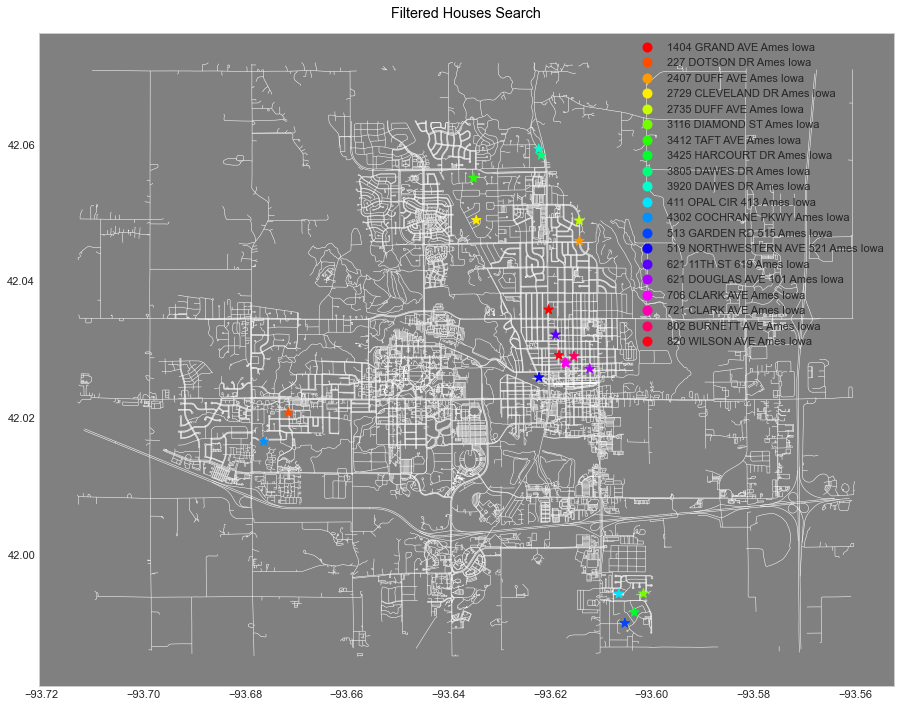

''

In [401]:
fig,ax = plt.subplots(figsize=(15,10))
ax.set(facecolor = "gray")
ax.grid(False)
filtered_houses.head(20).plot(ax=ax, legend=True, marker = '*', markersize=100, column='Address', cmap='hsv', alpha=1, zorder=2)
roads.plot(ax=ax, color='white', linewidth=0.5, zorder=1)
pl.suptitle("Filtered Houses Search", color='black')
plt.show()
;

# Price estimate feature